In [ ]:
#<img src="https://static.trueachievements.com/customimages/066267.jpg">

# Table Of Content



Understanding Data ,Data Maniplulation & Cleaning of Dataset

Exploratory Data Analysis

Project Hypothesis
   - Can attributes be use to predict & determine value of player ?
   - Identfy major attributes to best predict value of these player ? 
   - Identify the dollar value worth for players ?
   - Clustering of classes for outfield player 


Findings

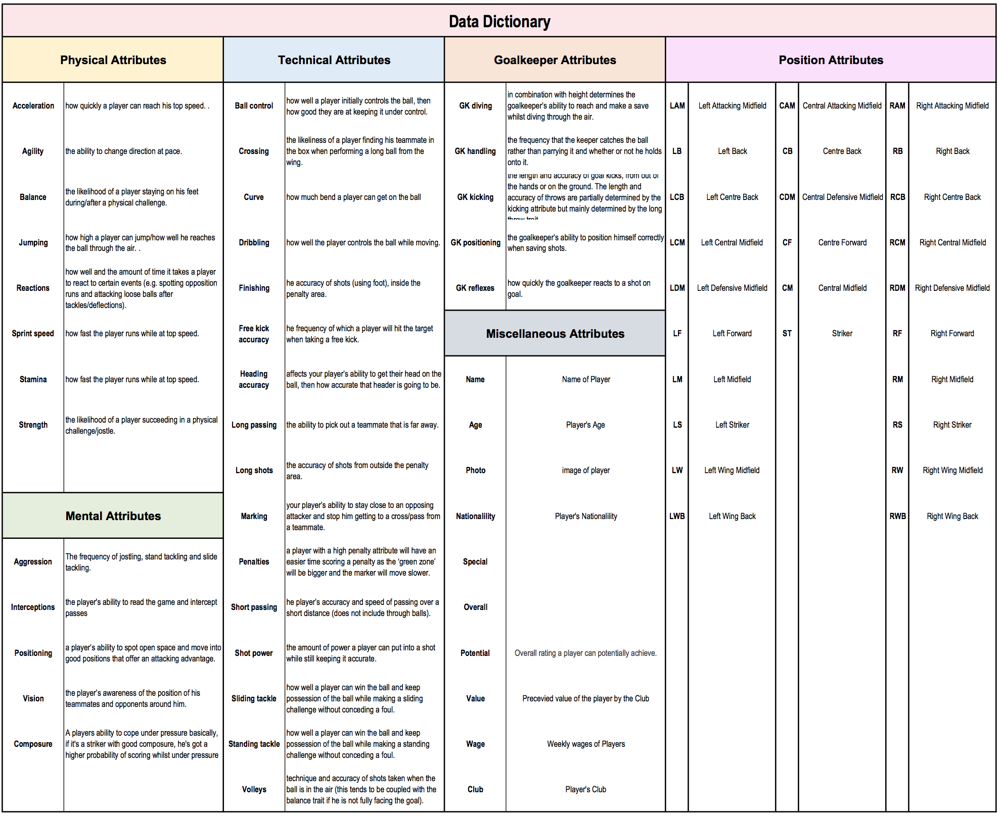


# <div class="alert alert-block alert-info"> <font size = '5.5',color='black'>1.0  Understanding Dataset , Data Manipulation and Data Cleaning </font></div>

In [1]:
# Intitaialization of the necassry package within Python

import numpy as np
import pandas as pd
import pprint as pp
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
from unidecode import unidecode as uni

sns.set_style('whitegrid')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline


## 1.1 Understanding the basic of the dataset.  

Objectives
  - Uploading and opening the CSV File into Python program 
  -  Basic Python command to understand the structure of the information in this dataset.

From the information as generated by python commands, this dataset comprise of 17981 row and 75 columns of datapoints. The information display their different attributes (i.e Technical, Phyiscal , Mental) , their Current Values, their Weekly Wages, Positional attributes and which International club they belong. 

Using the .describe method , the total counts ,means and standard deviation values with reference to each features(col) provided for this dataset. This provide some general ideas of the information needed for my  understanding , exploration and analysis of this dataset.

The .info method also provide with a snapshot view of the data types present. In this instance , the data types present in this dataframe are namely catogarized into interger, object and floats types.

In [2]:
# Opening of DataFile

fifa_csv = './CompleteDataset.csv'
#fifa = pd.read_csv(fifa_csv,encoding='utf-8')
fifa = pd.read_csv(fifa_csv)
fifaOrg = fifa.copy() # Original Dataframe...Keep for reference if needed.
fifa.head()


/anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (23,35) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,...,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
0,0,Cristiano Ronaldo,32,https://cdn.sofifa.org/48/18/players/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Real Madrid CF,https://cdn.sofifa.org/24/18/teams/243.png,...,61.0,53.0,82.0,62.0,91.0,89.0,92.0,91.0,66.0,92.0
1,1,L. Messi,30,https://cdn.sofifa.org/48/18/players/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,93,93,FC Barcelona,https://cdn.sofifa.org/24/18/teams/241.png,...,57.0,45.0,84.0,59.0,92.0,90.0,88.0,91.0,62.0,88.0
2,2,Neymar,25,https://cdn.sofifa.org/48/18/players/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,94,Paris Saint-Germain,https://cdn.sofifa.org/24/18/teams/73.png,...,59.0,46.0,79.0,59.0,88.0,87.0,84.0,89.0,64.0,84.0
3,3,L. Suárez,30,https://cdn.sofifa.org/48/18/players/176580.png,Uruguay,https://cdn.sofifa.org/flags/60.png,92,92,FC Barcelona,https://cdn.sofifa.org/24/18/teams/241.png,...,64.0,58.0,80.0,65.0,88.0,85.0,88.0,87.0,68.0,88.0
4,4,M. Neuer,31,https://cdn.sofifa.org/48/18/players/167495.png,Germany,https://cdn.sofifa.org/flags/21.png,92,92,FC Bayern Munich,https://cdn.sofifa.org/24/18/teams/21.png,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
print fifa.shape

(17981, 75)


In [4]:
print fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17981 entries, 0 to 17980
Data columns (total 75 columns):
Unnamed: 0             17981 non-null int64
Name                   17981 non-null object
Age                    17981 non-null int64
Photo                  17981 non-null object
Nationality            17981 non-null object
Flag                   17981 non-null object
Overall                17981 non-null int64
Potential              17981 non-null int64
Club                   17733 non-null object
Club Logo              17981 non-null object
Value                  17981 non-null object
Wage                   17981 non-null object
Special                17981 non-null int64
Acceleration           17981 non-null object
Aggression             17981 non-null object
Agility                17981 non-null object
Balance                17981 non-null object
Ball control           17981 non-null object
Composure              17981 non-null object
Crossing               17981 non-null obj

In [5]:
fifa.describe()

,Unnamed: 0,Age,Overall,Potential,Special,CAM,CB,CDM,CF,CM,...,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
count,17981.000000,17981.000000,17981.000000,17981.000000,17981.000000,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000,...,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000,15952.000000
mean,8990.000000,25.144541,66.247984,71.190813,1594.095100,59.251755,55.550464,56.865283,59.030028,58.506833,...,56.979689,55.550464,58.506833,56.865283,59.030028,60.057736,58.204050,59.359265,57.698721,58.204050
std,5190.811931,4.614272,6.987965,6.102199,272.151435,9.880164,12.192579,10.310178,9.926988,8.888040,...,9.791627,12.192579,8.888040,10.310178,9.926988,9.349180,9.181392,9.978084,9.142825,9.181392
min,0.000000,16.000000,46.000000,46.000000,728.000000,27.000000,25.000000,26.000000,27.000000,30.000000,...,30.000000,25.000000,30.000000,26.000000,27.000000,28.000000,31.000000,26.000000,31.000000,31.000000
25%,4495.000000,21.000000,62.000000,67.000000,1449.000000,53.000000,45.000000,49.000000,53.000000,53.000000,...,50.000000,45.000000,53.000000,49.000000,53.000000,54.000000,52.000000,53.000000,51.000000,52.000000
50%,8990.000000,25.000000,66.000000,71.000000,1633.000000,60.000000,57.000000,58.000000,60.000000,59.000000,...,58.000000,57.000000,59.000000,58.000000,60.000000,61.000000,59.000000,60.000000,58.000000,59.000000
75%,13485.000000,28.000000,71.000000,75.000000,1786.000000,66.000000,65.000000,65.000000,66.000000,65.000000,...,64.000000,65.000000,65.000000,65.000000,66.000000,67.000000,65.000000,66.000000,64.000000,65.000000
max,17980.000000,47.000000,94.000000,94.000000,2291.000000,92.000000,87.000000,85.000000,92.000000,87.000000,...,84.000000,87.000000,87.000000,85.000000,92.000000,90.000000,92.000000,91.000000,84.000000,92.000000


In [6]:
print fifa.columns

Index([u'Unnamed: 0', u'Name', u'Age', u'Photo', u'Nationality', u'Flag',
       u'Overall', u'Potential', u'Club', u'Club Logo', u'Value', u'Wage',
       u'Special', u'Acceleration', u'Aggression', u'Agility', u'Balance',
       u'Ball control', u'Composure', u'Crossing', u'Curve', u'Dribbling',
       u'Finishing', u'Free kick accuracy', u'GK diving', u'GK handling',
       u'GK kicking', u'GK positioning', u'GK reflexes', u'Heading accuracy',
       u'Interceptions', u'Jumping', u'Long passing', u'Long shots',
       u'Marking', u'Penalties', u'Positioning', u'Reactions',
       u'Short passing', u'Shot power', u'Sliding tackle', u'Sprint speed',
       u'Stamina', u'Standing tackle', u'Strength', u'Vision', u'Volleys',
       u'CAM', u'CB', u'CDM', u'CF', u'CM', u'ID', u'LAM', u'LB', u'LCB',
       u'LCM', u'LDM', u'LF', u'LM', u'LS', u'LW', u'LWB',
       u'Preferred Positions', u'RAM', u'RB', u'RCB', u'RCM', u'RDM', u'RF',
       u'RM', u'RS', u'RW', u'RWB', u'ST'],
      dtype=

## 1.2  Data Manipulation and Data Cleaning
 
Objectives 
  - Preparing dataset for analysis and modelling 
  - Identify and remove unwanted row and colums from dataset.
  - Identify and removal of Null value within dataset.
  - Bulit function to remove unwanted character and change value to float
  - Using lambda function to map and replace value
  - Rename the columns name where necessary

The procees start with visualization of a simple heatmap for the Null value. Figure 1.1 show the heatmap with "viridis" background. The yellow line region show present of Null value in this dataset. To identify , python's isnull command is use to provide number count  of null value. This provide the insight for decision to omit / replace the information from dataset columns.


 Figure 1.1


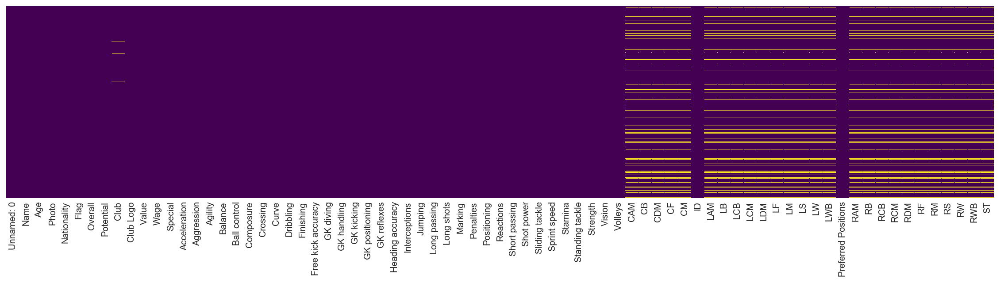

In [7]:
# Visualization... Heatmap to check for Null value.....

fig = plt.subplots(figsize=(20,4))
sns.heatmap(fifa.isnull(), yticklabels=False,cbar=False,cmap="viridis")
print " Figure 1.1"

Checking and verifying null items

In [8]:
# Confirm Null Value as per above heatmap.....
print fifa.isnull().sum()

Unnamed: 0                0
Name                      0
Age                       0
Photo                     0
Nationality               0
Flag                      0
Overall                   0
Potential                 0
Club                    248
Club Logo                 0
Value                     0
Wage                      0
Special                   0
Acceleration              0
Aggression                0
Agility                   0
Balance                   0
Ball control              0
Composure                 0
Crossing                  0
Curve                     0
Dribbling                 0
Finishing                 0
Free kick accuracy        0
GK diving                 0
GK handling               0
GK kicking                0
GK positioning            0
GK reflexes               0
Heading accuracy          0
                       ... 
Vision                    0
Volleys                   0
CAM                    2029
CB                     2029
CDM                 

Dropping unwanted Columns from the DataFrame

In [9]:
# Dropping unwanted Columns from the DataFrame

col_drop = ["Unnamed: 0","Photo" ,"Flag" ,"Club Logo"]
fifa.drop(col_drop,axis=1,inplace=True)


In [10]:
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17981 entries, 0 to 17980
Data columns (total 71 columns):
Name                   17981 non-null object
Age                    17981 non-null int64
Nationality            17981 non-null object
Overall                17981 non-null int64
Potential              17981 non-null int64
Club                   17733 non-null object
Value                  17981 non-null object
Wage                   17981 non-null object
Special                17981 non-null int64
Acceleration           17981 non-null object
Aggression             17981 non-null object
Agility                17981 non-null object
Balance                17981 non-null object
Ball control           17981 non-null object
Composure              17981 non-null object
Crossing               17981 non-null object
Curve                  17981 non-null object
Dribbling              17981 non-null object
Finishing              17981 non-null object
Free kick accuracy     17981 non-null ob

A define function "extract_value_from" is design to replace ("€") Euro dollor symbol from the dataset , also at the same time replacing (using lambda fuction) the information in "Value" and "Wage" columns into a float objects. Renaming these feature labels columns ensure the preservation of information. 

In [11]:
# Building a function to change '€' and replace float value
# Changing value and wage to numneric value

def extract_value_from(value):
    output = value.replace('€', '')
    if 'M' in output:
        output = float(output.replace('M', ''))*1000000
    elif 'K' in value:
        output = float(output.replace('K', ''))*1000
    return float(output)


In [12]:
# Calling function to replace the '€' and replace float value

fifa['Value'] = fifa['Value'].apply(lambda x: extract_value_from(x))
fifa['Wage'] = fifa['Wage'].apply(lambda x: extract_value_from(x))

# Renaming Columns Wage and Value 

fifa.rename(columns={"Wage":"Wage_Euro"}, inplace=True)
fifa.rename(columns={"Value":"Value_Euro"}, inplace=True)


In [13]:
# Preparing the Dataframe

# Subsetting dataframe to seperate GoalKeeper with Outfield Player
goalkeeper = fifa[fifa["Preferred Positions"]=='GK ']
print "Goalkeeper dataset :",goalkeeper.shape

# Subsetting dataframe for Outfield Player,omitting GoalKeeper Catogery
df=fifa[fifa["Preferred Positions"]!='GK']
df.shape , df.columns


Goalkeeper dataset : (2029, 71)


((17981, 71),
 Index([u'Name', u'Age', u'Nationality', u'Overall', u'Potential', u'Club',
        u'Value_Euro', u'Wage_Euro', u'Special', u'Acceleration', u'Aggression',
        u'Agility', u'Balance', u'Ball control', u'Composure', u'Crossing',
        u'Curve', u'Dribbling', u'Finishing', u'Free kick accuracy',
        u'GK diving', u'GK handling', u'GK kicking', u'GK positioning',
        u'GK reflexes', u'Heading accuracy', u'Interceptions', u'Jumping',
        u'Long passing', u'Long shots', u'Marking', u'Penalties',
        u'Positioning', u'Reactions', u'Short passing', u'Shot power',
        u'Sliding tackle', u'Sprint speed', u'Stamina', u'Standing tackle',
        u'Strength', u'Vision', u'Volleys', u'CAM', u'CB', u'CDM', u'CF', u'CM',
        u'ID', u'LAM', u'LB', u'LCB', u'LCM', u'LDM', u'LF', u'LM', u'LS',
        u'LW', u'LWB', u'Preferred Positions', u'RAM', u'RB', u'RCB', u'RCM',
        u'RDM', u'RF', u'RM', u'RS', u'RW', u'RWB', u'ST'],
       dtype='object'))

Dropping unwanted positional column information

In [14]:
Pos = [ 'CAM','CB','CDM','CF','CM',
        'ID','LAM','LB','LCB','LCM','LDM','LF','LM','LS',
        'LW','LWB','RAM','RB','RCB','RCM',
        'RDM','RF','RM','RS','RW','RWB','ST' ]
df.drop(Pos,axis=1,inplace=True)
df.shape

(17981, 44)

A quick check on the dataset also reveal that there are 248 players within have no affiliation to any the football club. Thus, "nan" value as appear will be replace with " NoClub"

In [15]:
# rechecking for ISNULL value
# With reference to below information , the Club columms still have Null value. This is due to fact the \n
# have no association with any soccer club
df.isnull().sum()

Name                     0
Age                      0
Nationality              0
Overall                  0
Potential                0
Club                   248
Value_Euro               0
Wage_Euro                0
Special                  0
Acceleration             0
Aggression               0
Agility                  0
Balance                  0
Ball control             0
Composure                0
Crossing                 0
Curve                    0
Dribbling                0
Finishing                0
Free kick accuracy       0
GK diving                0
GK handling              0
GK kicking               0
GK positioning           0
GK reflexes              0
Heading accuracy         0
Interceptions            0
Jumping                  0
Long passing             0
Long shots               0
Marking                  0
Penalties                0
Positioning              0
Reactions                0
Short passing            0
Shot power               0
Sliding tackle           0
S

Figure 1.2


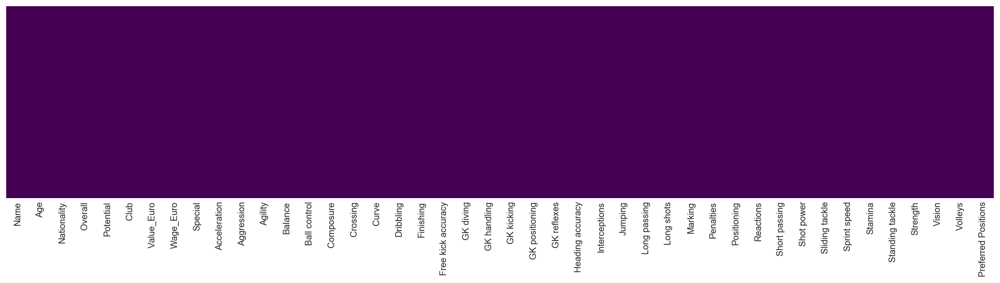

In [16]:
# Replacing all "nan" to NoClub for 206 players

df.Club = df.Club.map( lambda x: "NoClub" if str(x) == "nan" else x)

# FINAL Visualization... Heatmap to check for Null value..... Clear for all Null Value.....

fig = plt.subplots(figsize=(20,4))
sns.heatmap(df.isnull(), yticklabels=False,cbar=False,cmap="viridis")
print "Figure 1.2"

In [17]:
# Still have OBJECT ITEMS in dataframe... need further investigate on dataframe information. 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17981 entries, 0 to 17980
Data columns (total 44 columns):
Name                   17981 non-null object
Age                    17981 non-null int64
Nationality            17981 non-null object
Overall                17981 non-null int64
Potential              17981 non-null int64
Club                   17981 non-null object
Value_Euro             17981 non-null float64
Wage_Euro              17981 non-null float64
Special                17981 non-null int64
Acceleration           17981 non-null object
Aggression             17981 non-null object
Agility                17981 non-null object
Balance                17981 non-null object
Ball control           17981 non-null object
Composure              17981 non-null object
Crossing               17981 non-null object
Curve                  17981 non-null object
Dribbling              17981 non-null object
Finishing              17981 non-null object
Free kick accuracy     17981 non-null 

Another define function "transform_compound" is design to updated selected features columns and transform the information within to float for ease of processing whist modelling. The purpose of this fuction is to add/subtract to a float figure. (i.e 78+1=79 , 69-2=67 , etc )


In [18]:
# Transforming the value in Columms with Odd Value....( i.e 78+1 and etc)

def transform_compound(value):
   
    out = str(value)
    
    if '+' in out:
        a,b  = out.split('+')
        out = int(a)+int(b)
    
    elif '-' in out:
        a,b = out.split('-')
        out = int(a)-int(b)
    
    elif out == '':
        out = 0
    
    return float(out)

# looping over the Dataframe

for i in range(9,43):
    df.iloc[:,i] = df.iloc[:,i].apply(lambda x: transform_compound(x))
    

In [19]:
# Check and verify data cleaning process .... Confirm data Cleaning process cleared
# df is the dataframe for outfield player.
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17981 entries, 0 to 17980
Data columns (total 44 columns):
Name                   17981 non-null object
Age                    17981 non-null int64
Nationality            17981 non-null object
Overall                17981 non-null int64
Potential              17981 non-null int64
Club                   17981 non-null object
Value_Euro             17981 non-null float64
Wage_Euro              17981 non-null float64
Special                17981 non-null int64
Acceleration           17981 non-null float64
Aggression             17981 non-null float64
Agility                17981 non-null float64
Balance                17981 non-null float64
Ball control           17981 non-null float64
Composure              17981 non-null float64
Crossing               17981 non-null float64
Curve                  17981 non-null float64
Dribbling              17981 non-null float64
Finishing              17981 non-null float64
Free kick accuracy     17981

The final outcome of the Dataframe is as follows : 43 columns , 15952 entries which mostly change to either integer or floats data type. Only 3 columns have remain as objects data types.( Name, Nationalilty and Club )

 - There are 211 players that have no value assoicated with them
 - There are 206 players that have no wage associated with them.


# <div class="alert alert-block alert-info"> <font size = '5.5',color='black'>2.0  Exploratory Data Analysis (EDA) </font></div>

In [20]:
# USING PLOTLY

import plotly.plotly as py
import plotly
from unidecode import unidecode as uni
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
from plotly.graph_objs import *
init_notebook_mode(connected=False)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Objectives 
  - Examine relations among variable
  - Examine data for outliers
  - Examine trends and turning points
  - Examine distributional assumptions (i.e normality and constancy of variances)
  - Using visual diagram to represent the data information
  

### Distribution of player by Countries

Quick check on the list of countries from the dataframe

In [21]:
print "Nos of Countries :" , fifa['Nationality'].nunique(),"\n"
print " List of Countries"
print fifa['Nationality'].unique()

Nos of Countries : 165 

 List of Countries
['Portugal' 'Argentina' 'Brazil' 'Uruguay' 'Germany' 'Poland' 'Spain'
 'Belgium' 'Chile' 'Croatia' 'Wales' 'Italy' 'Slovenia' 'France' 'Gabon'
 'Sweden' 'Netherlands' 'Denmark' 'Slovakia' 'England' 'Colombia' 'Austria'
 'Greece' 'Czech Republic' 'Costa Rica' 'Armenia' 'Bosnia Herzegovina'
 'Ivory Coast' 'Senegal' 'Switzerland' 'Morocco' 'Guinea' 'Egypt' 'Algeria'
 'Cameroon' 'Serbia' 'Japan' 'Turkey' 'Ecuador' 'Montenegro'
 'Korea Republic' 'Kenya' 'Iceland' 'Mexico' 'Norway' 'DR Congo' 'Ukraine'
 'Russia' 'Finland' 'Republic of Ireland' 'United States' 'Venezuela'
 'Ghana' 'Uzbekistan' 'Nigeria' 'Canada' 'Paraguay' 'Romania' 'Albania'
 'Burkina Faso' 'Cape Verde' 'New Zealand' 'Northern Ireland' 'Syria'
 'Peru' 'Scotland' 'Bulgaria' 'Angola' 'Australia' 'South Africa' 'Jamaica'
 'Tunisia' 'Mozambique' 'Iran' 'Mali' 'Cuba' 'Hungary' 'Belarus'
 'Saudi Arabia' 'China PR' 'Israel' 'Benin' 'Georgia' 'Dominican Republic'
 'Lithuania' 'Kosovo' 'Mol

A world map have been plotted to show the distributions of players by their countries. This is follow by Boxplots to show Value and Wage distribution of these players.

In [22]:
# Plot Player distribution by different countries

nat=fifa.groupby("Nationality").Nationality.describe().freq

data= [dict(type = "choropleth",
           locations = nat.index,
            z = nat.values,
           locationmode = "country names",
           colorscale = "RdYlBu",
           text = nat.index)]

layout = dict(title = "Player distribution by Country",    
              geo = dict(
             showframe = True,
             showcoastlines = True))

fig = dict(data = data, layout=layout)

plotly.offline.plot(fig) 


'file:///Users/alvinlai/Desktop/fifa-18-demo-player-dataset/temp-plot.html'

In [1]:
%%HTML
<iframe width="100%" height="600" src ="temp-plot.html"></iframe>
Figure 2.1

### Boxplot distribution of Player's Value 

The value boxplot show that majority of player fall within within the 10e6 range. There are also a great number players with value 10e7 to 10e8 range. Only 2 nos of player fall beyond the 10e8 range. these are probably the superstar player. The trend was somewhat similar for Wage boxplot.This show higher value the club preceived for player, higher their wages

Figure 2.2


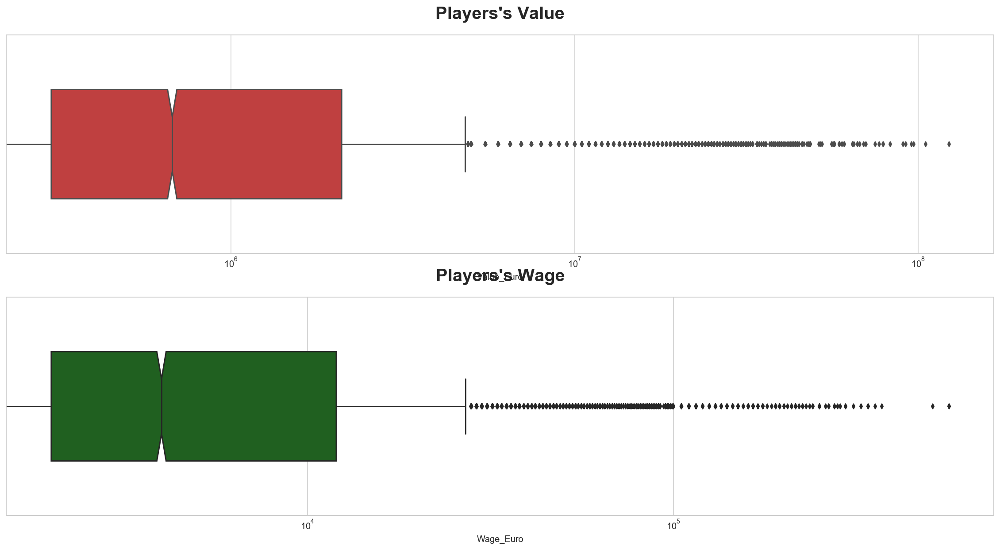

In [24]:
sns.set_style("whitegrid")
plt.figure(figsize = (20,10))

print "Figure 2.2"

# Player's Value
plt.subplot (2,1,1)
sns.boxplot(fifa['Value_Euro'], color='red',width=.5,saturation=.5,notch=True,
            dodge=True, fliersize=4)
plt.title("Players's Value", fontsize=20, fontweight='bold', y=1.05,)
plt.xscale('log')


# Player's Wage
plt.subplot (2,1,2)
sns.boxplot(fifa['Wage_Euro'], color='green',width=.5,saturation=.5,notch=True,
            dodge=True, fliersize=4)
plt.title("Players's Wage", fontsize=20, fontweight='bold', y=1.05,)
plt.xscale('log')


### Distribution plot of top 15 club (by Max and Mean value)

The factorplot is then generated to show the max and mean value/wage value paid by these club on their players. Only the top 15 club are plotted to provide an overview on these information. 


Factorplot by Max and Mean value distribution of top 15 Club

Figure 2.3


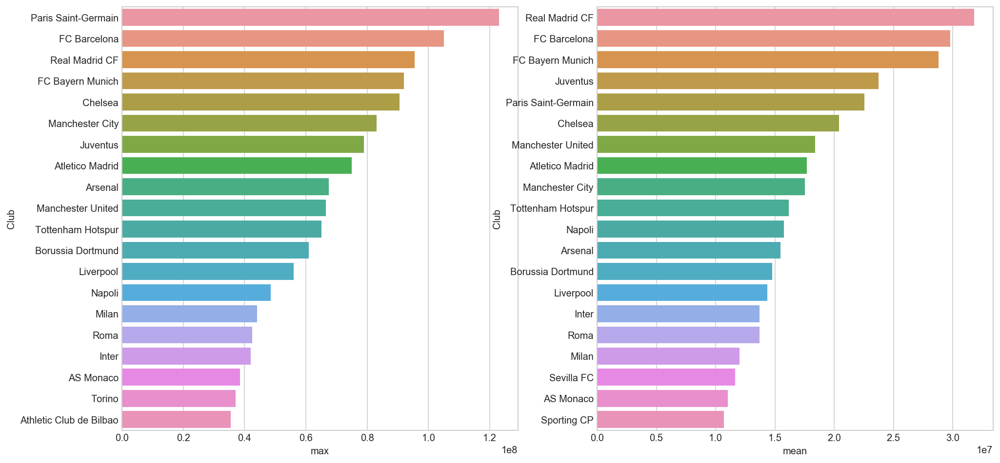

In [25]:
# Group by player's value
club_value = fifa.groupby("Club").Value_Euro.describe().reset_index()
club_value.to_csv('club_value.csv')
club_value = pd.read_csv('club_value.csv', encoding = 'utf-8')
club_value.Club = club_value.Club.map(lambda x: uni(x))

# Plotting for Value (Max and Mean)

#sns.set_style("whitegrid")
print "Figure 2.3"

f, ax = plt.subplots(1,2, figsize=(16,8))
g=sns.factorplot ( x="max" , y='Club', data=club_value.sort_values('max', ascending = False).nlargest(20,'max'),
                kind='bar',ax=ax[0])
h=sns.factorplot ( x="mean" , y='Club', data=club_value.sort_values('mean', ascending = False).nlargest(20,'mean'),
                kind='bar', ax=ax[1])

plt.tight_layout()

plt.close(g.fig)
plt.close(h.fig)
plt.show()


Factorplot by Max and Mean Wages distribution of top 15 Club

Figure 2.4


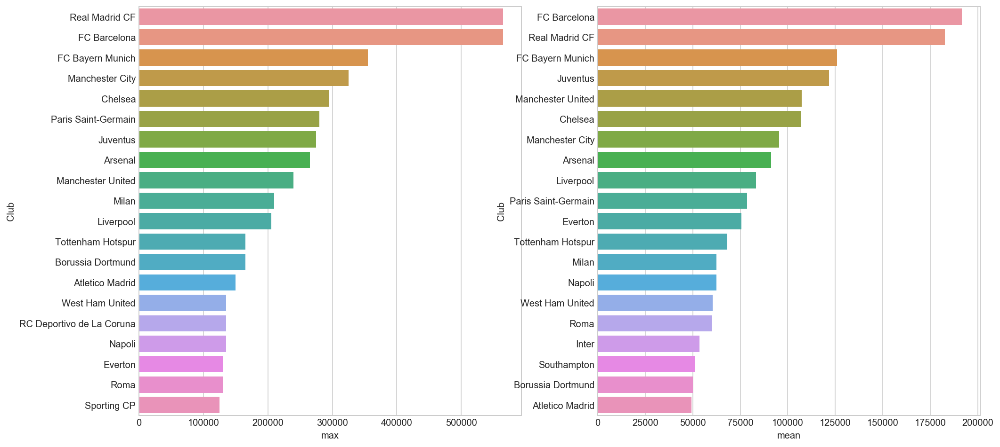

In [26]:
# Group by player's wage

club_wage = fifa.groupby("Club").Wage_Euro.describe().reset_index()
club_wage.to_csv('club_wage.csv')

club_wage = pd.read_csv('club_wage.csv', encoding = 'utf-8')
club_wage.Club = club_wage.Club.map(lambda x: uni(x))

print "Figure 2.4"

# Plotting for Wage (Max and Mean)
sns.set_style("whitegrid")

f,ax = plt.subplots (1,2, figsize = (16, 8))
a=sns.factorplot ( x="max" , y='Club', data=club_wage.sort_values('max', ascending = False).nlargest(20,'max'),
                kind='bar',ax=ax[0])

b= sns.factorplot ( x="mean" , y='Club', data=club_wage.sort_values('mean', ascending = False).nlargest(20,'mean'),
                kind='bar', ax=ax[1])

plt.tight_layout()
plt.close(a.fig)
plt.close(b.fig)
plt.show()

### Distribution plot of Player's ( by Age and Potential )

Distribution plots are derive under 3 different criteria

 - Player group by Age Attributes. Age Attributes spread across 16yrs to 47yrs old with high density concentration spreading across 20yrs to 25yrs old.
 - Player group by Potential Attributes. Potential Attributes spread across 46 to 94 range with high density concentration spreading across 67 to 75.
 - Player group by Overall Attributes. Overall Attributes also spread across 46 to 94 range with high density concentration spreading across 63 to 71.


Figure 2.5


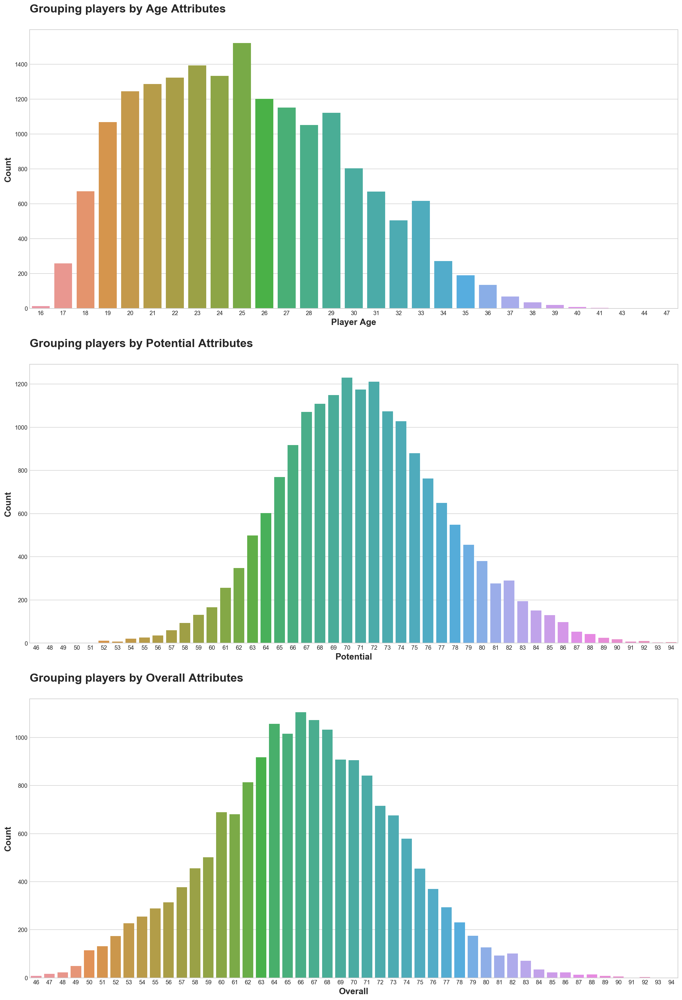

<function matplotlib.pyplot.tight_layout>

In [27]:
sns.set_style("whitegrid")
plt.figure(figsize = (20,30))

print "Figure 2.5"

# Plot 1_Grouping players by Age Attributes
plt.subplot (3,1,1)
sns.countplot(x ='Age',data= fifa)
plt.title('Grouping players by Age Attributes', fontsize=20, fontweight='bold', y=1.05, loc="left")
plt.xlabel('Player Age', fontsize=15, fontweight='bold')
plt.ylabel('Count', fontsize=15, fontweight='bold')


# Plot 2_Grouping players by Potential Attributes
plt.subplot(3,1,2)
sns.countplot(fifa['Potential'])
plt.title('Grouping players by Potential Attributes', fontsize=20, fontweight='bold', y=1.05,loc="left")
plt.xlabel('Potential', fontsize=15 , fontweight='bold')
plt.ylabel('Count', fontsize=15 ,fontweight='bold')


# Plot 3_Grouping players by Overall Attributes
plt.subplot(3,1,3)
sns.countplot(fifa['Overall'])
plt.title('Grouping players by Overall Attributes', fontsize=20, fontweight='bold', y=1.05,loc="left")
plt.xlabel('Overall', fontsize=15, fontweight='bold')
plt.ylabel('Count', fontsize=15, fontweight='bold')


plt.show()
plt.tight_layout


### Age, Potential rating, current rating study of all players

Line graph are derive using the mean of Potential and Overall attributes value. It show a consistent trend that at young age, potential value is high and gradually moving downward at age of 35yrs.

On the overall attributes, the value will move on a upward trend as they age, which can be explain that the player's overall skills level will increase due to exposure and experience in matches they have partcipate thru the years. But like the potential value, it move gradually move downwards also around the age 35 yrs because of the fall in physical level. 


Figure 2.6


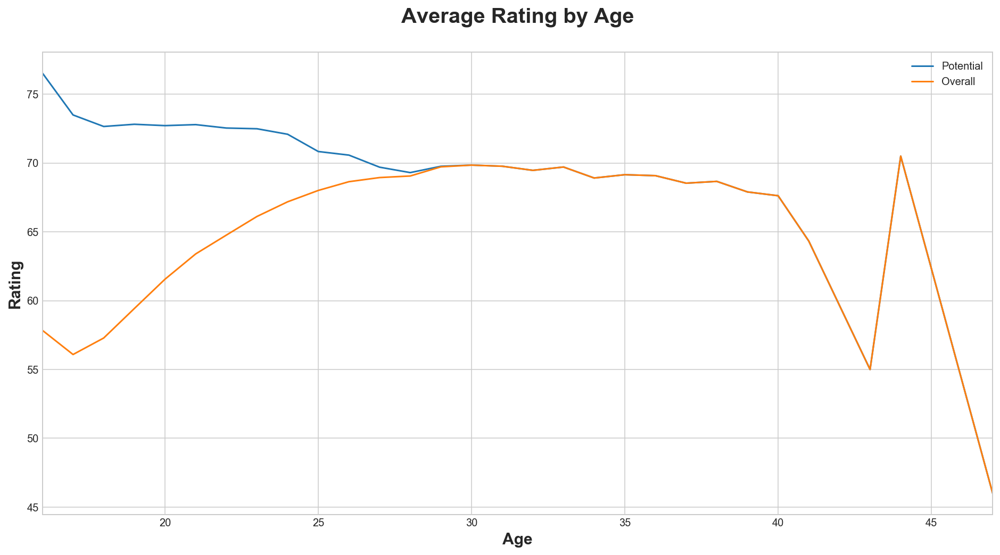

In [28]:
potential_points = fifa.groupby("Age")["Potential"].mean()

print "Figure 2.6"
sns.set_style("whitegrid")

df_p = fifa.groupby(['Age'])['Potential'].mean()
df_o = fifa.groupby(['Age'])['Overall'].mean()

df_summary = pd.concat([df_p, df_o], axis=1)

ax = df_summary.plot(figsize=(16,8))
ax.set_xlabel('Age',fontsize=15,fontweight='bold')
ax.set_ylabel('Rating',fontsize=15,fontweight='bold')

ax.set_title('Average Rating by Age', fontsize=20, fontweight='bold', y=1.05,)
plt.show()



An interesting point to note is that there is a spike at the 44yrs age. As shown in the below table , there are two player that have high potential and overall value. This is a small sample out of player's population (i.e only 2 example of these player). The can be classified as abnormaly as they cannot be representive of the population of players.


In [29]:
pd.DataFrame(potential_points).tail(15).transpose()

Age,30,31,32,33,34,35,36,37,38,39,40,41,43,44,47
Potential,69.853234,69.767511,69.468379,69.709887,68.911765,69.151832,69.080882,68.536232,68.666667,67.9,67.625,64.333333,55.0,70.5,46.0


In [30]:
fifa[fifa["Age"]==44]

,Name,Age,Nationality,Overall,Potential,Club,Value_Euro,Wage_Euro,Special,Acceleration,...,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
4839,O. Pérez,44,Mexico,71,71,Pachuca,160000.0,9000.0,1244,60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5314,E. El Hadary,44,Egypt,70,70,Al Taawoun,120000.0,7000.0,1047,28,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Correlation matrix _OutField Player in lieu of Technical , Mental and Physical Attributes

(17981, 44) 

Figure 2.7


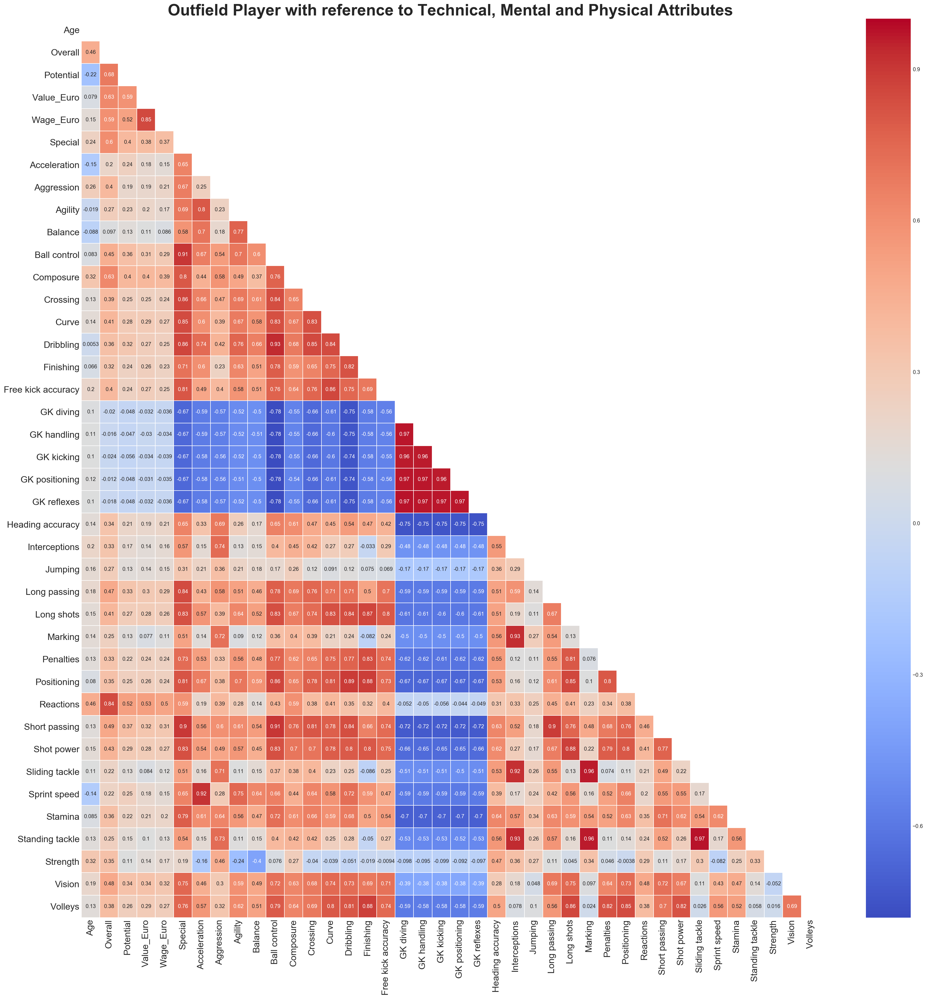

In [31]:
# Mapping HeatMap of Outfield Player Corr.
ofplayer = df.copy()
print ofplayer.shape,"\n"# Verify information before enter into corr matrix
Relcorr =ofplayer.corr()

print "Figure 2.7"
# Set the default matplotlib figure size:
fig, ax = plt.subplots(figsize=(31,31))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(Relcorr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns. This will let us resize the labels.
ax = sns.heatmap(Relcorr,mask=mask,annot=True,cmap="coolwarm",linewidths=0.5, linecolor='white')

# Resize the labels.
plt.title("Outfield Player with reference to Technical, Mental and Physical Attributes", fontsize=30, fontweight='bold')
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=17, rotation=90)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=17, rotation=0)

# If you put plt.show() at the bottom, it prevents those useless printouts from matplotlib.
plt.show()


A correlation diagram is generated to provide a quick view on the attributes relationship. This process allow a fast way to determine their association and hence help in finalization of features that will be use during modeling process.    


# <div class="alert alert-block alert-info"> <font size = '5.5',color='black'>3.0  Project Hypothesis </font></div>

In [32]:
# Intitaialization of the necassry package within Python for modelling

from sklearn.linear_model import Ridge, Lasso, LinearRegression, RidgeCV, LassoCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import explained_variance_score, make_scorer
from sklearn.cross_validation import KFold

from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist
import os

from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets
from ipywidgets import *

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
sns.set_style("whitegrid")

/anaconda/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



Objectives 
  - Clustering of players 
  - Using regression model to train and predict Value,Wage and ROI of outfield player
  - Improve accuracy of model use.
  - Use regression model to predict value,wage and ROI of player WITHOUT CLUB
  - Identify major attributes use for prediction
 
 
To achieve the above objectives , the following techniques (supervised and unsupervised learning) are being deployed for the project:
  - Hierarchical clustering 
  - Decision tree
  - Linear regression 
  - Ridge and lasso reduction
  - Principal Components Analysis
  - Random Forest
  

Sizing up dataframes and preparing data for model implementation for clustering model.

In [33]:
ofplayer_cul=df.copy()
ofplayer_cul = ofplayer_cul[ofplayer_cul["Preferred Positions"]!="GK "]
GK_col_drop = ['GK diving','GK handling','GK kicking','GK positioning','GK reflexes']
ofplayer_cul.drop(GK_col_drop,axis=1,inplace=True)
ofplayer_cul.shape

(15952, 39)

Sizing up dataframes and preparing data for model implementation for regresion model

In [34]:
# Grouping & Subsetting of dataframe for preparation to load into model.
ofplayer=ofplayer[ofplayer["Preferred Positions"]!="GK "]
GK_col_drop = ['GK diving','GK handling','GK kicking','GK positioning','GK reflexes','Preferred Positions']
ofplayer.drop(GK_col_drop,axis=1,inplace=True)


# ofp_val : refer to Outfield player_ with Valueofplayer[ofplayer["Preferred Positions"]!="GK "]
# ofp_Nval : refer to Outfield player_ with NO Value
# For Value , nos of player 211 players are without value

ofp_val = ofplayer[ofplayer["Value_Euro"]!= 0] # df WITHOUT 211 player that has no value
ofp_Nval = ofplayer[ofplayer["Value_Euro"]== 0] # df WITH 211 player that has no value


# ofp_wg : refer to Outfield player_ with Wage
# ofp_Nwg : refer to Outfield player_ with NO Wage
# For Value , nos of player 206 players are without Wage

ofp_wg = ofplayer[ofplayer["Wage_Euro"]!= 0] # df WITHOUT 206 player that has no Wage
ofp_Nwg = ofplayer[ofplayer["Wage_Euro"]== 0] # df WITH 206 player that has no Wage


ofp_ROI = ofplayer.copy()
ofp_ROI["ROI"] = ofp_ROI["Value_Euro"] - ((ofp_ROI["Wage_Euro"]*4)*12)
ofp_ROI= ofp_ROI[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
        'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
        'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing','Shot power',
        'Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision', 'Volleys', "ROI","Value_Euro"]]

ofp_ROI_wv = ofp_ROI[ofp_ROI["Value_Euro"]!= 0 ]
ofp_ROI_wov = ofp_ROI[ofp_ROI["Value_Euro"]== 0 ]
fp_ROI = ofp_ROI_wv.drop("Value_Euro",axis=1)
np_ROI = ofp_ROI_wov.drop("Value_Euro",axis=1)


# verification of dataframe size. 
print "Outfield player Value_Euro dataframe size",ofp_val.shape , ofp_Nval.shape
print 'Outfield player Wage_Euro dataframe size', ofp_wg.shape , ofp_Nwg.shape
print "Outfield player ROI dataframe size",ofp_ROI_wv.shape,ofp_ROI_wov.shape

Outfield player Value_Euro dataframe size (15741, 38) (211, 38)
Outfield player Wage_Euro dataframe size (15746, 38) (206, 38)
Outfield player ROI dataframe size (15741, 31) (211, 31)


## Clustering Model

## 3.1__Hierarchical Clustering

Hierarchical clustering (also called hierarchical cluster analysis or HCA) is a method of cluster analysis which seeks to build a hierarchy of clusters. 

Strategies for hierarchical clustering generally fall into two types:

- Agglomerative: This is a "bottom up" approach: each observation starts in its own cluster, and pairs of clusters are merged as one moves up the hierarchy.

- Divisive: This is a "top down" approach: all observations start in one cluster, and splits are performed recursively as one moves down the hierarchy.

In our case below, we have employed the "top down approach" method

In [35]:
x_kclu = ofplayer[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
        'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
        'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing','Shot power',
        'Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision', 'Volleys']]


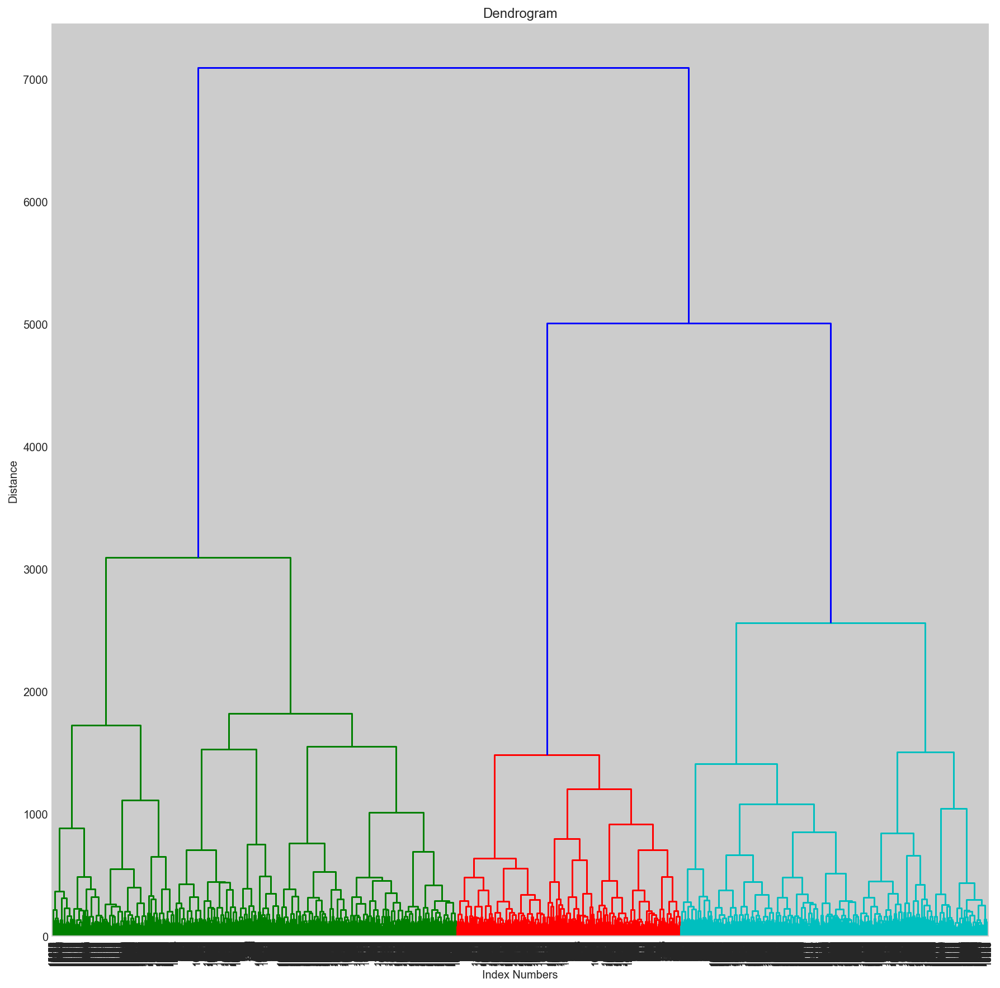

In [36]:
def plot_dendogram1(df):
    
    global X,Z,cluster,cluster1
    
    # Data prep
    X = df.as_matrix(columns=None)
    Z = linkage(X, 'ward')

    # plotting
    fig, ax = plt.subplots(figsize=(15, 15))
    plt.title('Dendrogram')
    plt.xlabel('Index Numbers')
    plt.ylabel('Distance')
    dendrogram(
        Z,
        leaf_rotation=90.,  
        leaf_font_size=8.,
    )
    plt.show()
    
plot_dendogram1(x_kclu)

In [37]:
# Finding different cluster 
max_d = 4500 # (Max dist of the cutoff)
cluster1 = fcluster(Z, max_d, criterion='distance')
cluster1.shape, cluster1

((15952,), array([1, 1, 1, ..., 1, 1, 3], dtype=int32))

In [38]:
global clusters

def plot_dist_thresh(max_dist=6000):
    # max_dist = 200 # pairwise distance
    # plot_dendogram(lang)
    clusters = fcluster(Z,max_dist, criterion='distance')
    print("Clusters represented at distance: ", set(clusters))
    
    # Complete color maps from matplotlib
    
    # plotting
    # Add legend with some customizations.

    #fig, ax = plt.subplots(2,2, figsize=(20, 10))

    fig, ax = plt.subplots(1,2, figsize=(20, 12))
    ax[0].scatter(X[:,4], X[:,19], c=clusters, cmap=cm.jet, s=40)
    ax[0].set_title("Max Dist: %d" % max_dist)
    
    # plt.legend(clusters, loc='upper right', shadow=True, scatterpoints=1)
    t = (0, max_dist)
    ax[1].plot((0, 200), (max_dist, max_dist), 'r----------------------------------------------')
    
    ax[1].set_title('Dendrogram')
    ax[1].set_xlabel('Index Numbers')
    ax[1].set_ylabel('Distance')
    dendrogram(
        Z,
        leaf_rotation=90.,  
        leaf_font_size=8.,
        #link_color_func=lambda color: cmaps['Miscellaneous'],
    )
    
def plot_wrapper(max_dist):
    plot_dist_thresh(max_dist)
    plt.show()

In [39]:
interact(plot_wrapper, max_dist=IntSlider(min=4000, max=6000, step=1000))

<function __main__.plot_wrapper>

Mapping information back to original dataframe and subset grouping

In [40]:
# Preparing dataframe
com_ofplayer = ofplayer_cul.copy()
com_ofplayer["group"] = cluster1

# Subsetting grouping 
cluster_1=com_ofplayer[com_ofplayer["group"]== 1]
cluster_2=com_ofplayer[com_ofplayer["group"]== 2]
cluster_3=com_ofplayer[com_ofplayer["group"]== 3]

cluster_1.shape,cluster_2.shape,cluster_3.shape

((6898, 40), (3811, 40), (5243, 40))

Identifying  cluster 1 players

In [41]:
cluster_1['Preferred Positions'].value_counts().head()

ST      1839
CM       329
CAM      295
RM       282
LM       236
Name: Preferred Positions, dtype: int64

Identifying  cluster 2 players

In [42]:
cluster_2['Preferred Positions'].value_counts().head()

CM CDM     450
CDM CM     386
LB         329
CM         251
RB         244
Name: Preferred Positions, dtype: int64

Identifying  cluster 3 players

In [43]:
cluster_3['Preferred Positions'].value_counts().head()

CB        2087
LB         407
RB         382
RB CB      241
CDM        198
Name: Preferred Positions, dtype: int64

### Decision Tree

In [44]:
#Setting up X and y input for Decision Tree
xc = x_kclu 
yc = cluster1

dtree = DecisionTreeRegressor(max_depth=2,random_state=101)
dtree.fit(xc, yc)

DecisionTreeRegressor(criterion='mse', max_depth=2, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=101, splitter='best')

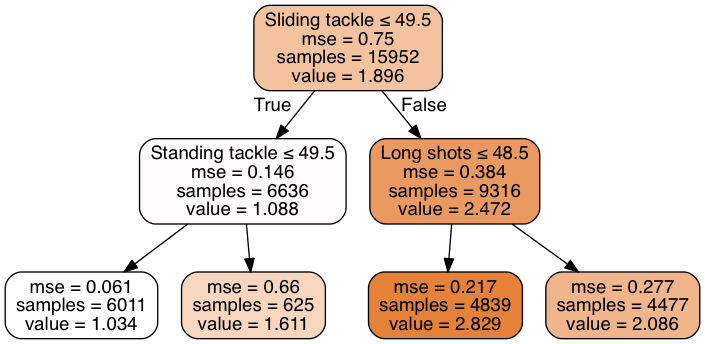

In [45]:
# Plotting Features Importances

dot_data = StringIO()  

export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=xc.columns)  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

#### Finding

From the Dendogram, we can clearly see that outfield players on the dataset are group into 3 clusters. With reference conslidated dataframe information, the cluster are roughly seperated into the following:

- cluster 1 : Majority class , forward position
- cluster 2 : Majority class , Midfield position
- cluster 3 : Majority class , Defend position

From the descision tree, we can also use the features importances as a rough estimator to support the Hierarchical  clustering grouping. 

The decision tree splits from sliding tackle to 2 main group long shots and standing tackle. 
- The long shot is a typical attribute for the attacking minded player and creative mid-fielder position
- Standing tackle is typical attribute for defensive minder player.



## REGRESSION MODEL

## 3.2  Prediction Of Value  

In statistics, linear regression is a linear approach for modeling the relationship between a scalar dependent variable y and one or more explanatory variables (or independent variables) denoted X.

#### Predicting value of Outfield player.

This exercise starts off with Linear regression modelling as basis. The (Y) target have been identify as the players value and the features (X) use are the technical, mental, physical attributes provided for by the datasets. 

There are altogether 29 columns features and 15741 row players use in linear regression techniques. When training the model, a ratio of 70/30 train, test, split (random) have been determine. the model starts with scaling process, fit and prediction of the value. A R2 score is use as the measurement metrics to determine the accuracy of the Linear regression model. 


Preparing the (X) features and (Y) target for Linear Regression 

In [46]:
# Identifying & Setting up the X and y variables

X = ofp_val[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
              'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
              'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing', 
              'Shot power','Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision',
              'Volleys']]

y = np.log(ofp_val["Value_Euro"])

# Check Dataframe 
X.shape , y.shape

((15741, 29), (15741,))

###  Linear Regression_ Value

Function define for Linear regression model calculation and graph plotting

The y_intercept : 13.69714396 

Mean Abs Error : 0.512781111895
Mean Sqr_Error : 0.428709832809
Mean_Root Sqr Error: 0.654759370157 

Y_hat_Mean(lr) : 13.7185485912
Linear Regression Score : 0.77438184212


SUMMARY of TOP 10 Coeff Value_Euro weights


,Reactions,Ball control,Short passing,Heading accuracy,Standing tackle,Composure,Acceleration,Finishing,Sprint speed,Dribbling
Coeff,0.453788,0.413214,0.252228,0.239187,0.235497,0.216963,0.18295,0.142962,0.135748,0.077657


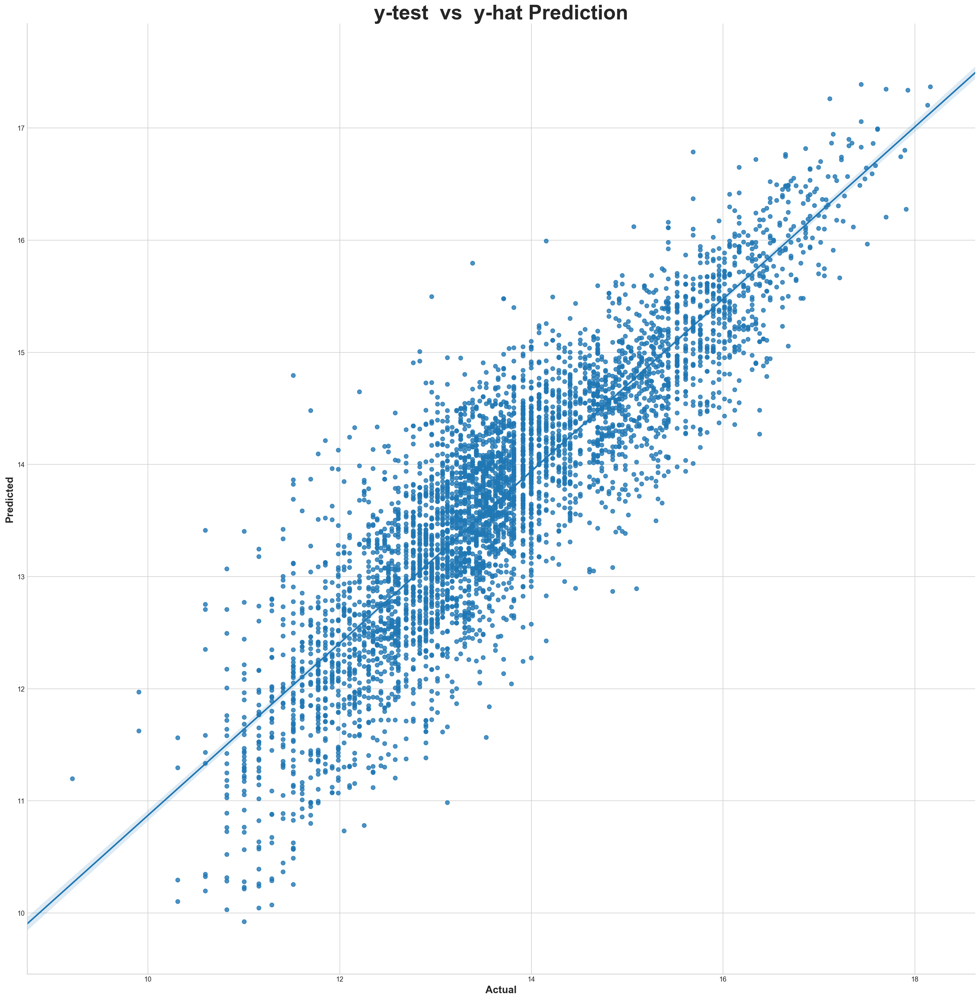

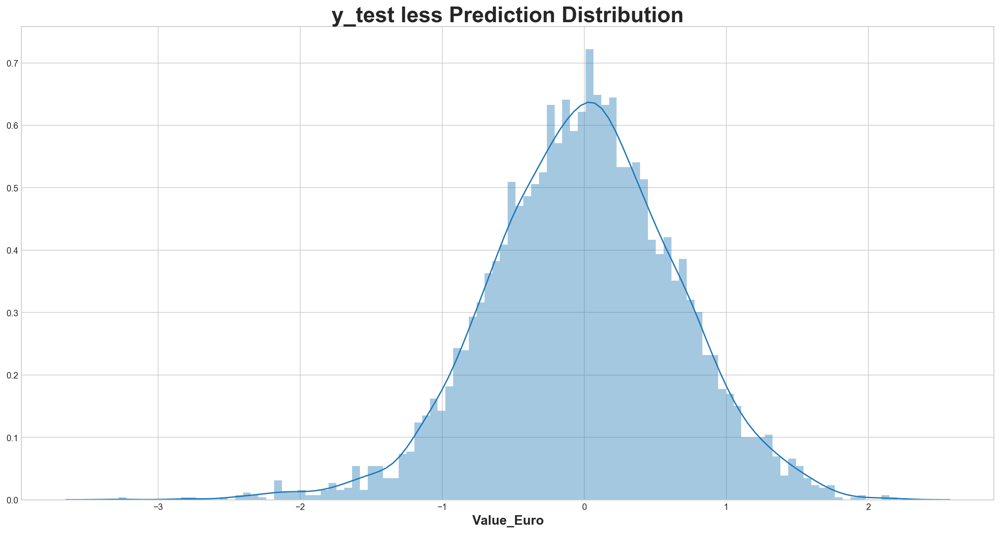

In [47]:
 ### Function for Player Value    
    
def linreg_fuc_val(X,y):    

    """ This is a linear regression function for player's value """

    # Setting up global value
    global X_train, X_test, y_train, y_test,Xs,Xt,lm_V,cdf


    ### LINEAR REGRESSION..... 


    # Setting up train and test set (70/30 split and randomize)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101,shuffle=True)

    # Scaling of data prior to fitting process
    scaler = StandardScaler().fit(X_train)
    Xs = scaler.transform(X_train)
    Xt = scaler.transform(X_test)

    # Regression Model fit and prediction
    lm_V = LinearRegression()
    lm_V.fit(Xs, y_train) # fitting training data (xs and y_train)
    prediction=lm_V.predict(Xt) # Use test data to predict (X test)

    # Plotting of predicted graphs ( y_test vs Y_hat prediction)
    dfpred = pd.DataFrame(data = zip(y_test,prediction),columns=['actual', 'pred'])
    #print "\n"
    sns.lmplot(x='actual',y='pred',data=dfpred,size=20)
    plt.title("y-test  vs  y-hat Prediction", fontsize=30, fontweight='bold')
    plt.xlabel('Actual', fontsize=15,fontweight='bold'),"/n"
    plt.ylabel('Predicted', fontsize=15,fontweight='bold')


    # Plotting of the distribution plot 
    fig, ax = plt.subplots(figsize=(20,10))
    sns.distplot((y_test-prediction),bins=100)
    plt.title("y_test less Prediction Distribution", fontsize=25, fontweight='bold')
    plt.xlabel('Value_Euro', fontsize=15,fontweight='bold')


    ###  LINEAR REGRESSION METRICS....

    print "The y_intercept :",(lm_V.intercept_),"\n"

    # Calculate and print metrics
    print "Mean Abs Error :", metrics.mean_absolute_error(y_test,prediction)
    print "Mean Sqr_Error :" ,metrics.mean_squared_error(y_test,prediction)
    print "Mean_Root Sqr Error:",np.sqrt(metrics.mean_squared_error(y_test,prediction)),"\n"

    # Calculate mean of 
    print "Y_hat_Mean(lr) :" ,np.mean(prediction)

    # Calculate and print score
    print "Linear Regression Score :", lm_V.score(Xt,y_test)
    print "\n"

    ### PLOT & SUMMARY......
    print "SUMMARY of TOP 10 Coeff Value_Euro weights"
    cdf = pd.DataFrame(lm_V.coef_,X.columns,columns=["Coeff"]).sort_values("Coeff",ascending=False)    
    return cdf.head(10).transpose()

# Calling on linear function lin_fuc
linreg_fuc_val(X,y) 

As it turn out, the Linear regression model can constantly achieved a decent R2 score of 0.77438184212 accuracy on  the Outfield player's value. Cross validation of K-fold have also been put in place to check and verify against the Linear regression model. The accuracy score obtained from cross validation produced the an almost same score to the Linear regression model.

In [48]:
# Linear Regression Cross Validation

reg_scores = cross_val_score(LinearRegression(), Xs, y_train, cv=20)
print "Linear Regression Score :",reg_scores,"\n","Linear Mean Score :",np.mean(reg_scores)


Linear Regression Score : [ 0.77496657  0.7666851   0.8039614   0.74985836  0.7944436   0.76695651
  0.76910195  0.78420445  0.77320005  0.76722555  0.79034336  0.77593593
  0.78307641  0.76221261  0.80559025  0.78323789  0.77702836  0.76423382
  0.77411619  0.78415395] 
Linear Mean Score : 0.777526616091


Lasso ( least absolute shrinkage and selection operator )  and Ridge are regression analysis method that performs both variable selection and regularization in order to enhance the prediction accuracy and interpretability of the statistical model it produces.

### Lasso Regression_Value

The Lasso Regression performs L1 regularization, i.e. adds penalty equivalent to absolute value of the magnitude of coefficients. Minimization objective = LS Obj + α * (sum of absolute value of coefficients) where 'LS Obj' refers to ‘least squares objective’, i.e. the linear regression objective without regularization.

In [49]:
# Running LASSO Model 

print "LASSO Model"
las1=LassoCV()
las1.fit(Xs,y_train)
pred2=las1.predict(Xt)
print "LASSO Score :",las1.score(Xt,y_test),"\n"

# LASSO Cross Validation
print "LASSO Cross Validation"
reg_scores1= cross_val_score(LassoCV(), Xs, y_train, cv=20)
print "LASSO Score(per k-fold) :", reg_scores1,"\n","LASSO Mean Score :" , np.mean(reg_scores1)


LASSO Model
LASSO Score : 0.774449154582 

LASSO Cross Validation
LASSO Score(per k-fold) : [ 0.77539044  0.76681157  0.804245    0.75083203  0.79475859  0.7668107
  0.76887061  0.78423196  0.77343488  0.76739681  0.7904744   0.77560186
  0.78217538  0.76135347  0.80547134  0.78299329  0.7773072   0.76385359
  0.77274812  0.78477425] 
LASSO Mean Score : 0.777476774665


###  Ridge Regression_Value

The Ridge Regression the performs L2 regularization, i.e. adds penalty equivalent to square of the magnitude of coefficients. Minimization objective = LS Obj + α * (sum of square of coefficients) where 'LS Obj' refers to ‘least squares objective’, i.e. the linear regression objective without regularization.

In [50]:
# Running Ridge Model

print "RIDGE Model"
#Rig1=Ridge(alpha=alphas)
Rig1=RidgeCV()
Rig1.fit(Xs, y_train)
Pred3=Rig1.predict(Xt)
print "RIDGE Score :",Rig1.score(Xt,y_test),"\n"

#RIDGE Cross Validation
print "RIDGE Cross Validation"
reg_scores2 = cross_val_score(RidgeCV(), Xs, y_train, cv=20)
print "RIDGE Score(per k-fold) :", reg_scores2,"\n","RIDGE Mean Score :" , np.mean(reg_scores2)


RIDGE Model
RIDGE Score : 0.774404656973 

RIDGE Cross Validation
RIDGE Score(per k-fold) : [ 0.77499332  0.7666958   0.80403691  0.74996834  0.7944613   0.76695305
  0.76915488  0.78426532  0.77325806  0.76721683  0.79034801  0.77594633
  0.78298949  0.76211582  0.8055513   0.78324237  0.77707234  0.76416727
  0.77399044  0.78424081] 
RIDGE Mean Score : 0.777533398513


The Ridge and Lasso reduction techniques have been employed here to seek enchancement for the R2 score value.However, there were not much significant improvement toward the prediction result for both model in this case. This lead me to believe that the Linear regression model is already behaving in it's optimal performance.

### Principal Component Analysis (PCA)

Principal component analysis (PCA) is a statistical procedure that uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components (or sometimes, principal modes of variation). The number of principal components is less than or equal to the smaller of the number of original variables or the number of observations. 

This transformation is defined in such a way that the first principal component has the largest possible variance (that is, accounts for as much of the variability in the data as possible), and each succeeding component in turn has the highest variance possible under the constraint that it is orthogonal to the preceding components. The resulting vectors are an uncorrelated orthogonal basis set.

Function  define for PCA reduction , Linear regression model calculation and graph plotting. Running with 16 PC components



The y_intercept : 13.69714396 

Mean Abs Error : 0.527542850892
Mean Sqr_Error : 0.45189636491
Mean_Root Sqr Error: 0.672232374191 

Linear Regression Score : 0.762179409939
Y_hat_Mean(lr) : 13.718606456


SUMMARY of PCA Coeff weights 

[ 0.39261891  0.21129813  0.09684456  0.06171193  0.02703812  0.0229333
  0.01957149  0.01613673  0.01497203  0.01376435  0.01323588  0.01130584
  0.01013997  0.00936261  0.00894694  0.0087854 ]
-------------------------------------

['Name' 'Age' 'Nationality' 'Overall' 'Potential' 'Club' 'Value_Euro'
 'Wage_Euro' 'Special' 'Acceleration' 'Aggression' 'Agility' 'Balance'
 'Ball control' 'Composure' 'Crossing' 'Curve' 'Dribbling' 'Finishing'
 'Free kick accuracy' 'Heading accuracy' 'Interceptions' 'Jumping'
 'Long passing' 'Long shots' 'Marking' 'Penalties' 'Positioning'
 'Reactions' 'Short passing' 'Shot power' 'Sliding tackle' 'Sprint speed'
 'Stamina' 'Standing tackle' 'Strength' 'Vision' 'Volleys']
-------------------------------------

PC1 weight

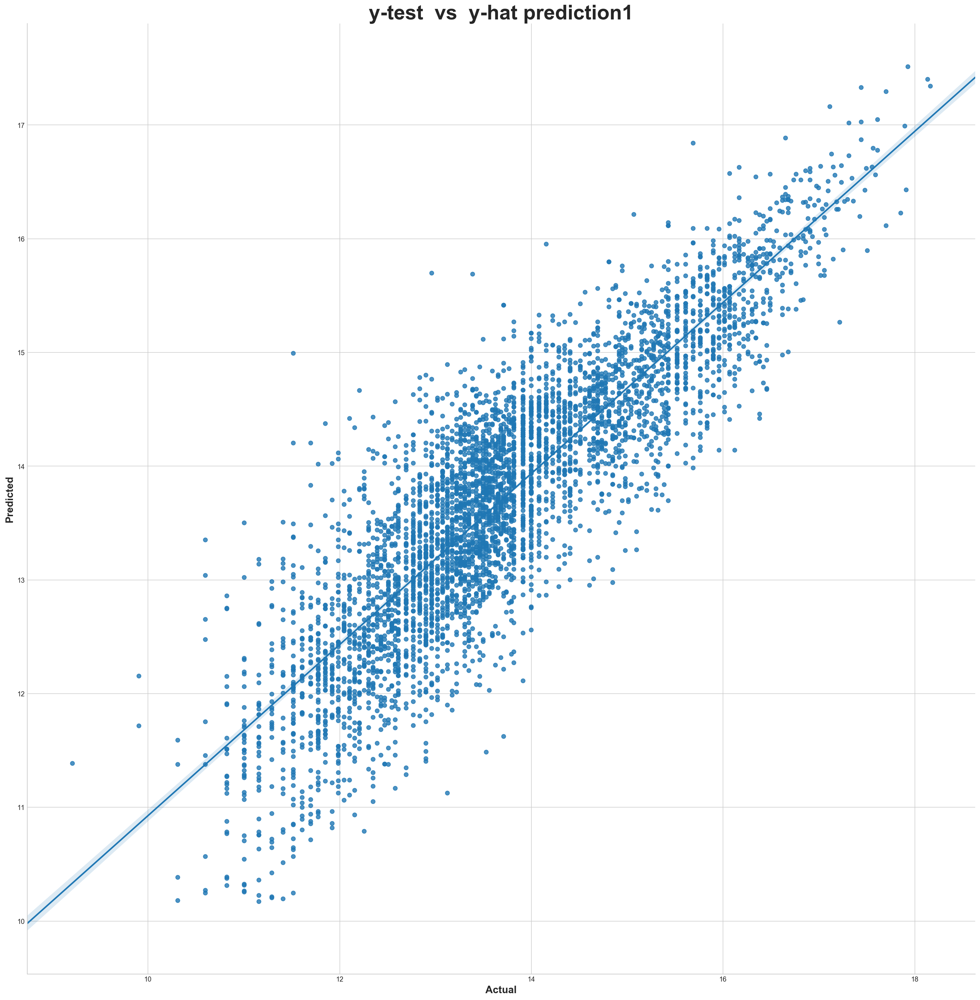

In [51]:
def pca_lin_fuc_val(X,y,z):    

    """ This function use PCA and linear regression for player's value """
    
# Setting up global value
    global X_train, X_test, y_train, y_test,Xs1,Xt1,lm_PCA,pref_cm
    

### LINEAR REGRESSION..... 
    
# Setting up train and test set ( 70/30 split and randomize)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101,shuffle=True)
    
# Scaling of data prior to fitting process
    scaler = StandardScaler().fit(X_train)
    Xs1 = scaler.transform(X_train)
    Xt1 = scaler.transform(X_test)
    
# FITTING INTO PCA
    pref_pca = PCA(n_components=z)
    pref_pca.fit(Xs1)

# TRANFORMATION OF DIMENSIONS
    X_pca = pref_pca.transform(Xs1)
    y_pca = pref_pca.transform(Xt1)
    
    
# Regression Model fit and prediction1
    lm_PCA = LinearRegression()
    lm_PCA.fit(X_pca, y_train)
    prediction1=lm_PCA.predict(y_pca)
    
# Plotting of predicted graphs ( y_test vs Y_hat prediction1)
    dfpred = pd.DataFrame(data = zip(y_test,prediction1),columns=['actual', 'pred'])
    print "\n"
    sns.lmplot(x='actual',y='pred',data=dfpred,size=20)
    plt.title("y-test  vs  y-hat prediction1", fontsize=30, fontweight='bold')
    plt.xlabel('Actual', fontsize=15,fontweight='bold'),"/n"
    plt.ylabel('Predicted', fontsize=15,fontweight='bold')
    
### LINEAR REGRESSION METRICS....
    
    print "The y_intercept :",(lm_PCA.intercept_),"\n"
    
# Calculate and print metrics
    print"Mean Abs Error :", metrics.mean_absolute_error(y_test,prediction1)
    print"Mean Sqr_Error :" ,metrics.mean_squared_error(y_test,prediction1)
    print"Mean_Root Sqr Error:",np.sqrt(metrics.mean_squared_error(y_test,prediction1)),"\n"

# Calculate and print score
    print "Linear Regression Score :", lm_PCA.score(y_pca,y_test)
    # Calculate mean of 
    print "Y_hat_Mean(lr) :" ,np.mean(prediction1)
    print "\n"
    
    
### PLOT & SUMMARY......
    print "SUMMARY of PCA Coeff weights","\n"
    pref_comp = pref_pca.components_
    pref_cm = pref_pca.explained_variance_ratio_
    print pref_pca.explained_variance_ratio_
    
    print '-------------------------------------\n'

    print ofp_val.columns.values
   
    print '-------------------------------------\n'

    x_PCA =["PC"+str(i) for i in range(1,z+1,1)]
    
    for i, pc in enumerate(x_PCA):
        print pc, 'weighting vector:', pref_comp[i]
        print '-------------------------------------\n'

pca_lin_fuc_val(X,y,16)  # Calling PCA Function    

Experimenting with dimensional reduction techniques (PCA), by converting a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components,it was hope that improvement can be achieve for the R2 score. Out of 29 features, it seem that by reducing to 16 PC,the Linear regression can yield an R2 accuracy score of 0.762173763189


Plotting the Elbow plot for 16 PCA to show the descreasing effectiveness of subsequent principal components in differentiating the data points. From the plot, the location of sharp bend happen at 5 PC location point.

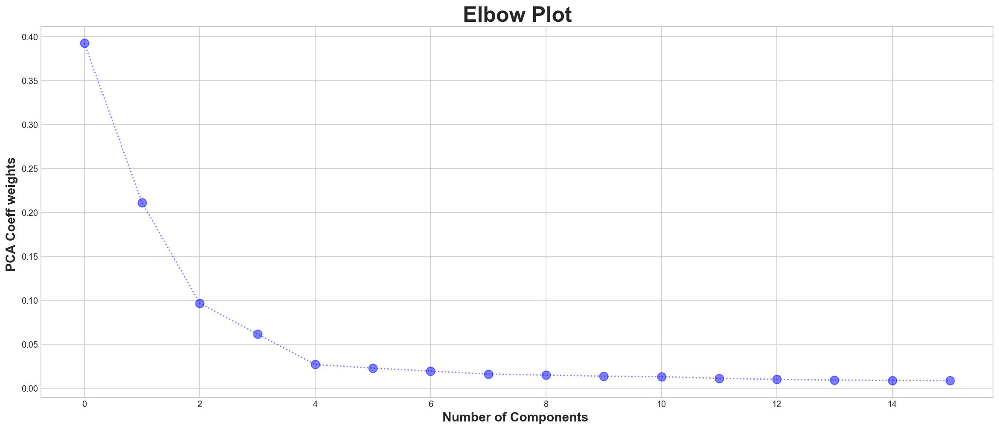

In [52]:
# Elbow Plots for PCA

marker_style = dict(color='blue', linestyle=':', marker='o',markersize=10, markerfacecoloralt='gray')

fig, ax = plt.subplots(figsize=(20,8))
plt.plot(pref_cm,alpha = 0.5,**marker_style)

plt.xlabel( 'Number of Components ', fontsize=15, fontweight='bold', rotation = 0)
plt.ylabel( 'PCA Coeff weights ', fontsize=15, fontweight='bold', rotation = 90)
plt.title("Elbow Plot", fontsize=25, fontweight='bold')


Running PCA Function with 5 PC components



The y_intercept : 13.69714396 

Mean Abs Error : 0.622694092081
Mean Sqr_Error : 0.618966401971
Mean_Root Sqr Error: 0.786744178225 

Linear Regression Score : 0.674255058516
Y_hat_Mean(lr) : 13.7277763067


SUMMARY of PCA Coeff weights 

[ 0.39261891  0.21129813  0.09684456  0.06171193  0.02703714]
-------------------------------------

['Name' 'Age' 'Nationality' 'Overall' 'Potential' 'Club' 'Value_Euro'
 'Wage_Euro' 'Special' 'Acceleration' 'Aggression' 'Agility' 'Balance'
 'Ball control' 'Composure' 'Crossing' 'Curve' 'Dribbling' 'Finishing'
 'Free kick accuracy' 'Heading accuracy' 'Interceptions' 'Jumping'
 'Long passing' 'Long shots' 'Marking' 'Penalties' 'Positioning'
 'Reactions' 'Short passing' 'Shot power' 'Sliding tackle' 'Sprint speed'
 'Stamina' 'Standing tackle' 'Strength' 'Vision' 'Volleys']
-------------------------------------

PC1 weighting vector: [ 0.15676724 -0.00578091  0.20395596  0.15090074  0.25953951  0.18150214
  0.2187876   0.25046964  0.26555688  0.243948

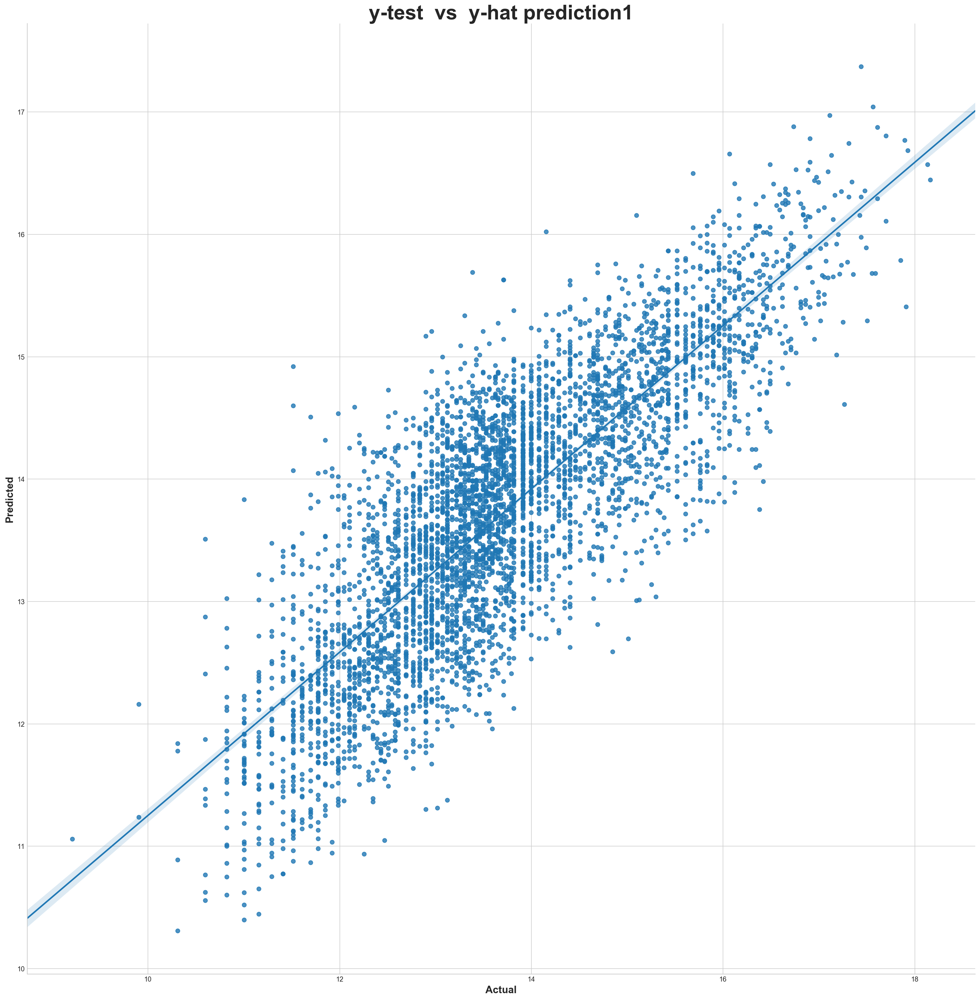

In [53]:
pca_lin_fuc_val(X,y,5)

For PCA, most of weighting value shall be limited to first few position of the PCA. The elbow plot (used in this case ) have indicated that the first 5 PC with highest value, and thereafter began to converge slowly. By untilzling the first 5 PC, the model yield an R2 accuracy  score : 0.674263879594.  This outcome provide us the information that weighting after 5 PC still have certain signifcant values to the prediction if we want to maintain accuracy equivalant to that of Original linear regression model.


### Random Forest Regression_Value

Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks, that operate by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees.

Define fuction for plotting of learning curve

In [54]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - An object to be used as a cross-validation generator.
          - An iterable yielding train/test splits.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : integer, optional
        Number of jobs to run in parallel (default 1).
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

title = "Learning Curves (Random Forest)"
# Cross validation with 100 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=0)

plt.show()

Implementing Random Forest regressor model

In [55]:
# Random Forest Regressor model

rf = RandomForestRegressor(random_state =101)
rf.fit(Xs, y_train)
yhat = rf.predict(Xt)
print 'Random Forest test Score:', rf.score(Xt, y_test)
print 'Random Forest training Score:', rf.score(Xs, y_train)


Random Forest test Score: 0.89442834808
Random Forest training Score: 0.980676119


Comparing the random forest test and training score above, we can see that 0.0862 gap between them. We then implement the Grid search function to look for the optimal hyperparameters for this model  

In [56]:
# Grid_Search for Optimal value..

rf_params = {'max_depth':[1,3,5,9,15,20,25],"max_features": [5,10,15,20,25,29]}
rf_gridsearch = GridSearchCV(rf, rf_params, cv=5, verbose=1)
rf_gridsearch.fit(Xs, y_train)


Fitting 5 folds for each of 42 candidates, totalling 210 fits


[Parallel(n_jobs=1)]: Done 210 out of 210 | elapsed:  1.3min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=101, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_features': [5, 10, 15, 20, 25, 29], 'max_depth': [1, 3, 5, 9, 15, 20, 25]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=1)

Final outcomes after running Grid search have provided the below information.

In [57]:
# Printing Best Parameter , Features Importance and RF score

print "Grid Search Best Parameter :", rf_gridsearch.best_params_,"\n"
print "Feature importance :",rf_gridsearch.estimator.feature_importances_, "\n"
print "Random Forest test Score (after Grid Search) :",rf_gridsearch.best_estimator_.score(Xt,y_test)
print "Random Forest train Score (after Grid Search) :",rf_gridsearch.best_estimator_.score(Xs,y_train),"\n"


Grid Search Best Parameter : {'max_features': 15, 'max_depth': 20} 

Feature importance : [ 0.00978487  0.00399712  0.00301387  0.00327074  0.36845153  0.0053764
  0.00482325  0.00313111  0.01441101  0.01656843  0.00328508  0.01749974
  0.01020051  0.00411943  0.00413975  0.00391344  0.03765135  0.00317494
  0.01557777  0.30031238  0.00994985  0.00655337  0.00936047  0.0164453
  0.01525892  0.09588772  0.00525975  0.00482884  0.00375307] 

Random Forest test Score (after Grid Search) : 0.895522245929
Random Forest train Score (after Grid Search) : 0.980284867785 



After running the Grid search fuction, the new gap score is 0.0847 and as compared with the above 0.0862 ( without grid search ). It did not present significant improvement. To see if overfitting occur for the random forest model, a learning curve is being plotted .  

Using a max depth of '20' (optimal) as recommended by Grid search.

<module 'matplotlib.pyplot' from '/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

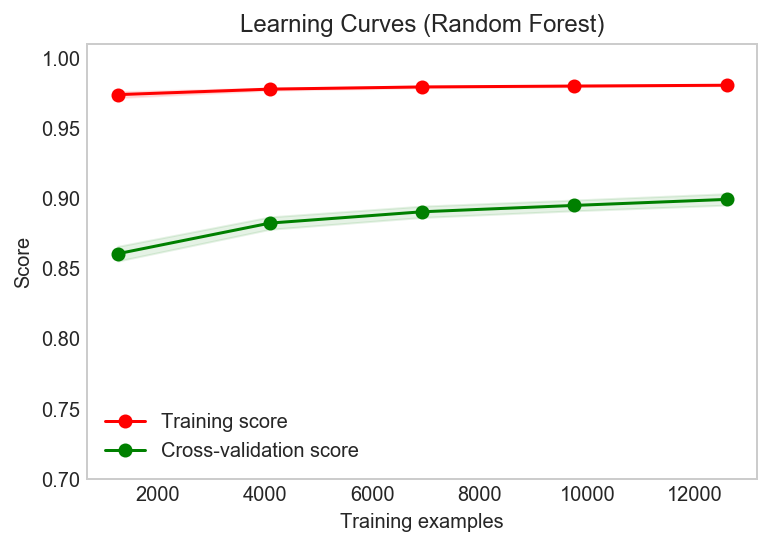

In [58]:
estimator = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=20,
           max_features=15, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=101, verbose=0, warm_start=False)

plot_learning_curve(estimator, title, X, y, ylim=(0.7, 1.01),cv=cv, n_jobs=-1)

From above curve, further investigation will be needed to identify as to why the training score remain in a constant flat line.

To determine the behaviour of the learning curve, the max_depth hyperparameter is set to 7.  The new gap score is 0.0231 after hyperparamneter change. Comparing to the gap score as obtain for max_depth 20 (0.0847), we manage to achieve an improvement of 0.0616 (i.e 6%). 


In [92]:
# Reducing max depth to 7
rf_rev1 = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=7,
           max_features=15, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=101, verbose=0, warm_start=False)
rf_rev1.fit(Xs, y_train)
yhat = rf_rev1.predict(Xt)
print 'Random Forest test Score:', rf_rev1.score(Xt, y_test)
print 'Random Forest training Score:', rf_rev1.score(Xs, y_train)


Random Forest test Score: 0.871173565123
Random Forest training Score: 0.89420759842


Using max depth of '7'

<module 'matplotlib.pyplot' from '/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

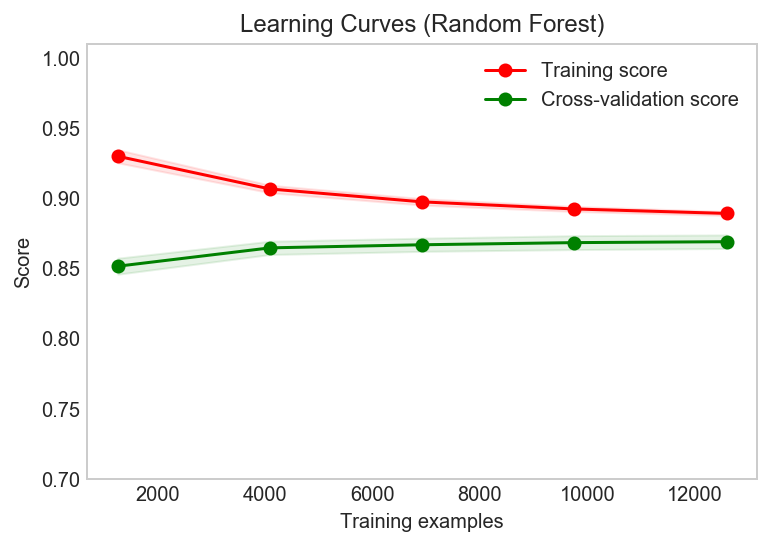

In [91]:
estimator = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=7,
           max_features=15, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=101, verbose=0, warm_start=False)

plot_learning_curve(estimator, title, X, y, ylim=(0.7, 1.01),cv=cv, n_jobs=-1)

The testing and training learning curves converge at similar values. By reducing the maximum tree depth from 20 to 5, this model preform better at preventing overfitting and more adept in generalizing to new data

Setting up the features use for Random forest and print out the Top 10 coeff weighting predicted by model.

In [61]:
# Random forest Coeff

X = ofp_val[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
              'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
              'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing', 
              'Shot power','Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision',
              'Volleys']]

BestAttr = pd.DataFrame({'feature':X.columns,'importances':rf_gridsearch.estimator.feature_importances_}).sort_values("importances",ascending=False)
BestAttr.head(10).transpose() # Random Forest Coeff


,4,19,25,16,11,9,23,18,24,8
feature,Ball control,Reactions,Standing tackle,Marking,Heading accuracy,Finishing,Sprint speed,Positioning,Stamina,Dribbling
importances,0.368452,0.300312,0.0958877,0.0376513,0.0174997,0.0165684,0.0164453,0.0155778,0.0152589,0.014411


Plotting the regression graph for Random Forest prediction.

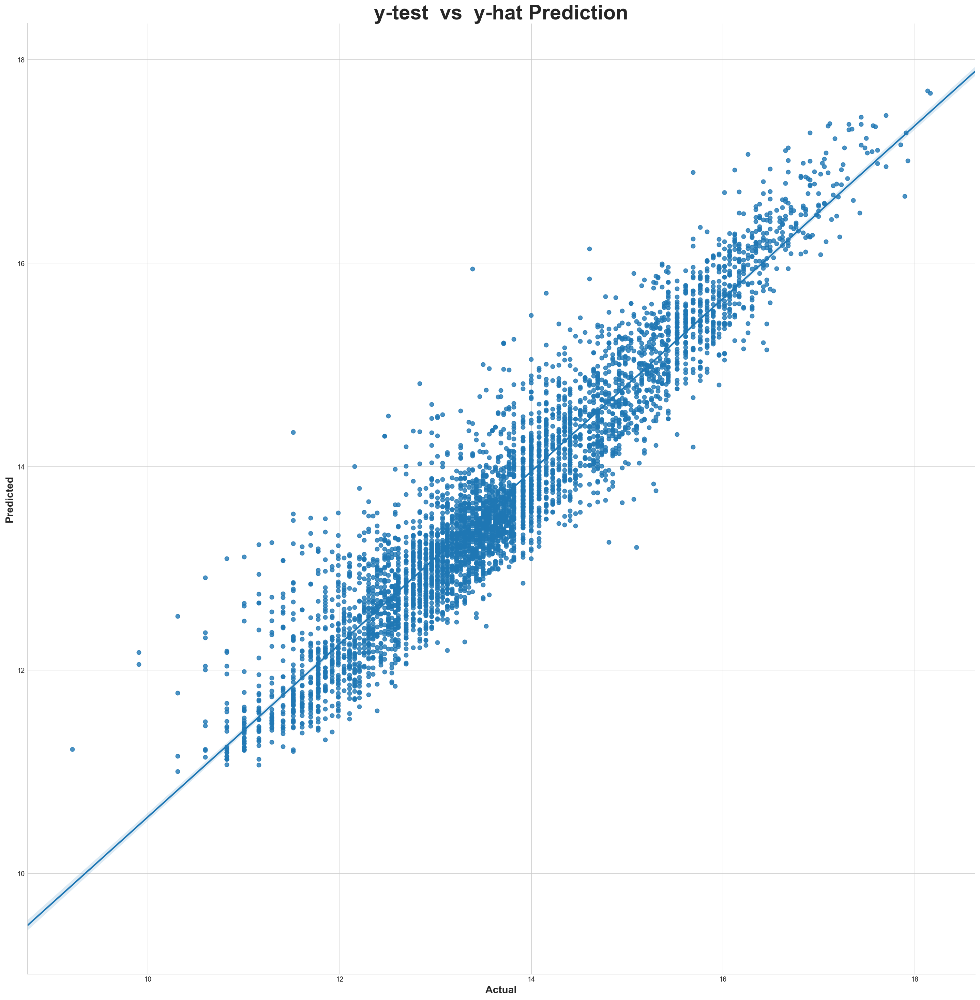

In [62]:
# Plotting of predicted graphs ( y_test vs Y_hat prediction)

Rfpred = pd.DataFrame(data = zip(y_test,yhat),columns=['actual', 'pred'])
print "\n"
sns.lmplot(x='actual',y='pred',data=Rfpred,size=20)
plt.title("y-test  vs  y-hat Prediction", fontsize=30, fontweight='bold')
plt.xlabel('Actual', fontsize=15,fontweight='bold'),"/n"
plt.ylabel('Predicted', fontsize=15,fontweight='bold')


### Predicting Value of 211 Outfield player_ Without Club ( Linear Regression )

From the dataset, it been noticed that there were 211 players that has no affiliation with any club. With the information obtained from above testing, it been suggested that we can use linear regression and random forest model to best predict and obtain values for these players. 

In [63]:
# Setting up dataframe for Fit Transform

z = ofp_Nval[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
        'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
        'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing','Shot power',
        'Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision', 'Volleys']]


Define Linear regression fuction for prediction of player's value without club

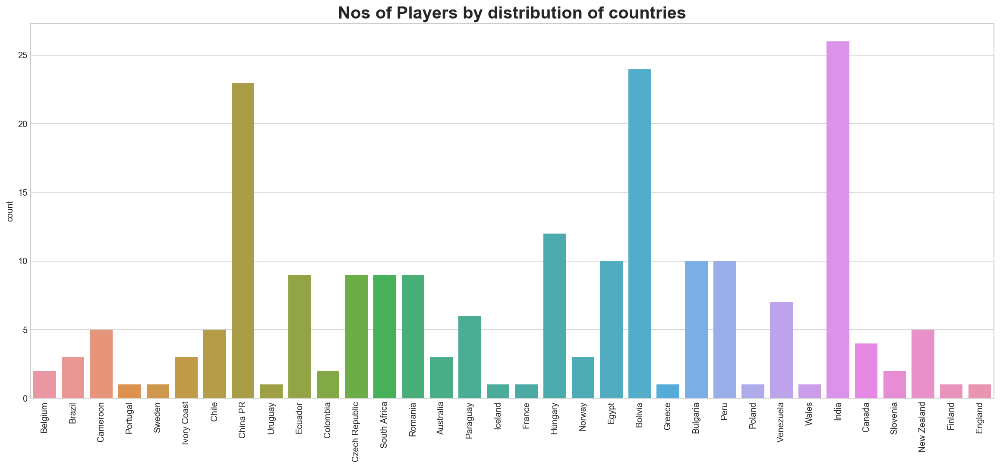

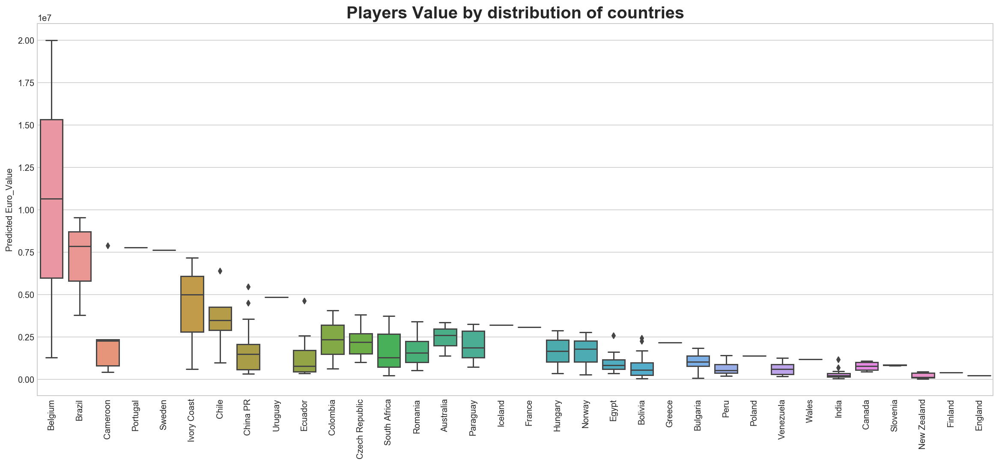

,2,0,6,4,1,3,5,25,22,36
Nationality,Belgium,Brazil,Cameroon,Brazil,Portugal,Sweden,Ivory Coast,Chile,China PR,Ivory Coast
Age,28,25,28,29,28,30,30,32,31,25
Overall,82,83,77,80,83,80,79,74,74,73
Potential,82,86,77,80,83,80,79,74,74,77
Player_Name,A. Witsel,Oscar,B. Moukandjo,Renato Augusto,Adrien Silva,M. Berg,Gervinho,J. Fuenzalida,Gao Lin,S. Deli
Predicted Euro_Value,2.00045e+07,9.55361e+06,7.87651e+06,7.85978e+06,7.77143e+06,7.61923e+06,7.17285e+06,6.38377e+06,5.46052e+06,4.992e+06


In [64]:
# Prediction function for player's Value without club

### LINEAR REGRESSION

def lin_pred_val (z,col):

    """ This is a linear regression function for prediction of player's value """

    global predvalue,com,lin

# Prediction of value for Zero value players.
    
    scaler = StandardScaler().fit(z)
    Xnull=scaler.transform(z)

    prediction= lm_V.predict(Xnull)
    predvalue = np.exp(prediction)
    
# Prepare data for merging to prepare for Outcome table

    nclubpreddf = pd.DataFrame(data = zip(ofp_Nval.Name,predvalue),columns=["Player_Name", 'Predicted Euro_'+ col])    
    nclubpreddf_Value_Euro = nclubpreddf.copy()

    AgeCont=pd.concat([ofp_Nval.Nationality,ofp_Nval.Age],axis=1)
    AgeCont= AgeCont.join(ofp_Nval["Overall"],how="right")
    AgeCont= AgeCont.join(ofp_Nval["Potential"],how="right")

    AgeCont_reset = AgeCont.copy(deep=False)
    AgeCont_reset.reset_index(drop=True, inplace=True)
    com = AgeCont_reset.join(nclubpreddf,how='right').sort_values("Predicted Euro_"+col,ascending=False)

# Count Plot distribution
    
    fig, ax = plt.subplots(figsize=(20,8))
    sns.countplot(x ='Nationality',data= com)
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=10, rotation=90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Nos of Players by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    
# Value Plot distribution 

    plt.subplots(figsize = (20,8))
    sns.boxplot(x =com['Nationality'], y=com["Predicted Euro_Value"], data = com)#.set_xticklabels(70)
    plt.xticks(rotation = 90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Players Value by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    plt.show()

    
# Final Outcome Table
    lin = com
    return com.head(10).transpose() 

lin_pred_val(z,'Value') # Calling Linear Regression function

### Predicting Value of 211 Outfield player_ Without Club ( Random Forest Regression )

Define Random Forest regression fuction for prediction of player's value without club

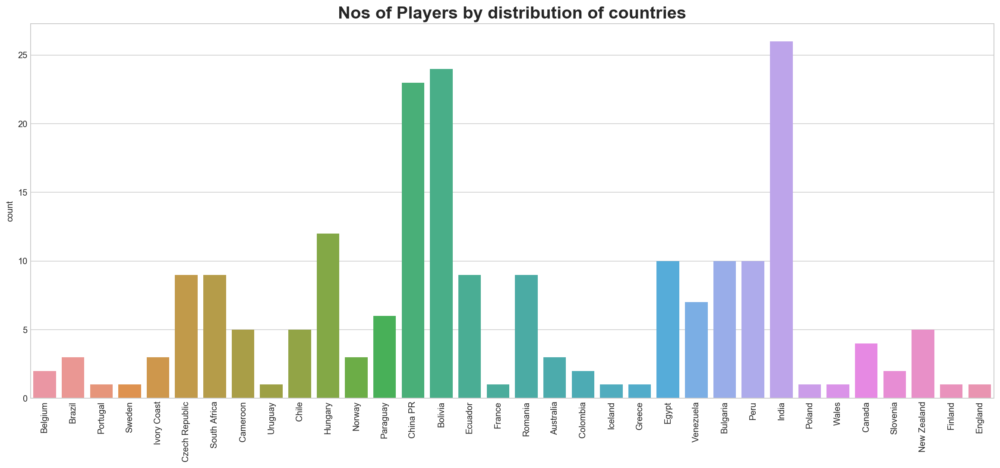

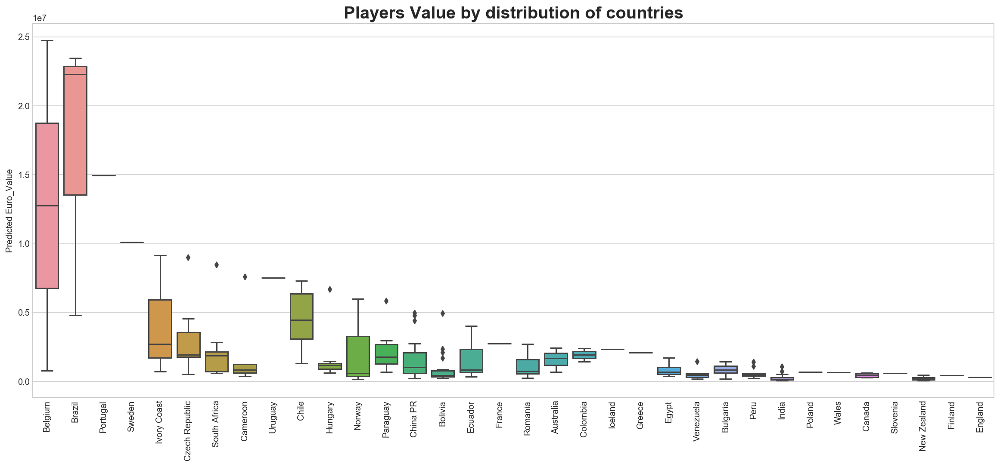

,2,4,0,1,3,5,7,11,6,17
Nationality,Belgium,Brazil,Brazil,Portugal,Sweden,Ivory Coast,Czech Republic,South Africa,Cameroon,Uruguay
Age,28,29,25,28,30,30,28,23,28,31
Overall,82,80,83,83,80,79,77,76,77,75
Potential,82,80,86,83,80,79,77,78,77,75
Player_Name,A. Witsel,Renato Augusto,Oscar,Adrien Silva,M. Berg,Gervinho,B. Dočkal,P. Tau,B. Moukandjo,C. Rodríguez
Predicted Euro_Value,2.47361e+07,2.34555e+07,2.22712e+07,1.49402e+07,1.01227e+07,9.15257e+06,9.00096e+06,8.47168e+06,7.58087e+06,7.52058e+06


In [65]:
### RANDOM FOREST

def rf_pred_val (z,col):
    
    """ This is a Random forest regression function for prediction of player's value """
    global predvalue,com, ranf 
    

# Prediction of value for Zero value players.
    
    scaler = StandardScaler().fit(z)
    Xnull=scaler.transform(z)

    prediction= rf_rev1.predict(Xnull)
    predvalue = np.exp(prediction)
    
# Prepare data for merging to prepare for Outcome table

    nclubpreddf = pd.DataFrame(data = zip(ofp_Nval.Name,predvalue),columns=["Player_Name", 'Predicted Euro_'+ col])    
    nclubpreddf_Value_Euro = nclubpreddf.copy()

    AgeCont=pd.concat([ofp_Nval.Nationality,ofp_Nval.Age],axis=1)
    AgeCont= AgeCont.join(ofp_Nval["Overall"],how="right")
    AgeCont= AgeCont.join(ofp_Nval["Potential"],how="right")

    AgeCont_reset = AgeCont.copy(deep=False)
    AgeCont_reset.reset_index(drop=True, inplace=True)
    com = AgeCont_reset.join(nclubpreddf,how='right').sort_values("Predicted Euro_"+col,ascending=False)

# Count Plot distribution
    
    fig, ax = plt.subplots(figsize=(20,8))
    sns.countplot(x ='Nationality',data= com)
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=10, rotation=90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Nos of Players by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    
# Value Plot distribution 

    plt.subplots(figsize = (20,8))
    sns.boxplot(x =com['Nationality'], y=com["Predicted Euro_Value"], data = com)#.set_xticklabels(70)
    plt.xticks(rotation = 90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Players Value by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    plt.show()

    
# Final Outcome Table
    ranf = com
    return com.head(10).transpose() 


rf_pred_val(z,'Value') # Calling Random Forest Function

#### Summarize table _Top 6 players predicted by Model

In [123]:
#  Summarize table for Predicted Euro_Value

# Linear regression table
lintable = lin.sort_index(ascending = True ).rename(columns={"Predicted Euro_Value":"LR Predicted Euro_Value"}) 

# Random forest Table
rftable = ranf.sort_index(ascending = True).rename(columns={"Predicted Euro_Value":"RF Predicted Euro_Value"}) 

# insert subset table and find the difference in Predicted Euro Value 
rftable["LR Predicted Euro_Value"]= lintable["LR Predicted Euro_Value"]
rftable["Diff Predicted Euro_Value"] = rftable["RF Predicted Euro_Value"] - rftable["LR Predicted Euro_Value"]
rftable.sort_values("RF Predicted Euro_Value", ascending =False).head(6).transpose()

 

,2,4,0,1,3,5
Nationality,Belgium,Brazil,Brazil,Portugal,Sweden,Ivory Coast
Age,28,29,25,28,30,30
Overall,82,80,83,83,80,79
Potential,82,80,86,83,80,79
Player_Name,A. Witsel,Renato Augusto,Oscar,Adrien Silva,M. Berg,Gervinho
RF Predicted Euro_Value,2.47361e+07,2.34555e+07,2.22712e+07,1.49402e+07,1.01227e+07,9.15257e+06
LR Predicted Euro_Value,2.00045e+07,7.85978e+06,9.55361e+06,7.77143e+06,7.61923e+06,7.17285e+06
Diff Predicted Euro_Value,4.73162e+06,1.55957e+07,1.27176e+07,7.16876e+06,2.5035e+06,1.97971e+06


###### Finding 

From the above table, we can see that linear regression and random forest have made same prediction for the same players about 7 out 10 times. These 7 players are potential opportunities for agent representation.

These two model may predict different value for every player. Hence, we shall take the maximum of these values to serve as upper limit and vice versa minimum value. Such information is useful during negotiation of their transfer.

- Values for this 6 players ranges from 2.4 x 10e7 to 7.1 x 10e6

- Brazilian player (South America) have the widest value gap among all the 7 player. As general indication, this show that the Brazilian player as having better asset value. The gap is between 1.2 x 10e7 to 1.5 x 10e7.

- This then follow by player from the European continent ( Portugual and Belgium ) , where their range 4.7 x 10e6 to 7.1 x 10e6

- The rest player are quite modest in their value gap ranging from 2.5 x 10e6  to 1.9 x 10e6



The other players (8 nos) that been identfy through prediction as potential but seemly different between model are as follow :

#### From Linear Regression model: 
 - index 6 , Cameroon, B. Moukandjo
 - Index 25 , Chile , J. Fuenzalida
 - Index 22 , China , Gao Lin	
 - Index 36 , Ivory Coast , S. Deli
 
#### From Random Forest model:
 - index 7 , Czech Republic , B. Dočkal
 - index 11 , South Africa , P.Tau
 - index 17, Uruguay , C. Rodríguez
 - index 6 , Cameroon, B. Moukandjo
 
These 6 players should also be keep under close watch as potential valuable player that could be acquire for future placement.
                              

# 3.3__Prediction of Wages 

Predicting Wage of Outfield player.

Using the same concept as before , we have applied the same method to the prediction of wages for these outfield players.

#### Parameter Summary
- (y1) target value has been change to Wage
- (X1) features (technical, mental, physical attributes ) remain the same as previous.
- The are altogether 29 columns features and 15741 row players
- A ratio of 70/30 train , test , split (random) have been determine. the model start with scaling process,fit and prediction of the value. 
- R2 score is use as the measurement metrics to determine the accuracy of the model
- Cross validation of 5 K-fold have also been put in place to check and verify against model.

On this exercise, the following models are use: 
( These three models were selected based on accuracy score performance for the pervious exercise ) 
- Linear regression model
- Lasso reduction
- Random Forest regression


Preparing the (X1) features and (y1) target for Linear Regression 

In [69]:
# Identifying & Setting up the X and y variables

X1 = ofp_wg[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
              'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
              'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing', 
              'Shot power','Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision',
              'Volleys']]

y1 = np.log(ofp_wg["Wage_Euro"])


print X1.shape,y1.shape,"\n"

(15746, 29) (15746,) 



Function define for Linear regression model calculation and graph plotting

In [70]:
### Function for Player Wage   
    
def linReg_fuc_Wage(X,y):    

# Setting up global value
    global X_train1, X_test1, y_train1, y_test1,Xs1,Xt1,lm_W
    

### LINEAR REGRESSION..... 
    
# Setting up train and test set ( 70/30 split and randomize)
    X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.3, random_state=101,shuffle=True)
    
# Scaling of data prior to fitting process
    scaler = StandardScaler().fit(X_train1)
    Xs1 = scaler.transform(X_train1)
    Xt1 = scaler.transform(X_test1)

# Regression Model fit and prediction
    lm_W = LinearRegression()
    lm_W.fit(Xs1, y_train1)
    prediction=lm_W.predict(Xt1)
    
# Plotting of predicted graphs ( y_test vs Y_hat prediction)
    dfpred = pd.DataFrame(data = zip(y_test1,prediction),columns=['actual', 'pred'])
    print "\n"
    sns.lmplot(x='actual',y='pred',data=dfpred,size=20)
    plt.title("y-test  vs  y-hat Prediction", fontsize=30, fontweight='bold')
    plt.xlabel('Actual', fontsize=15,fontweight='bold'),"/n"
    plt.ylabel('Predicted', fontsize=15,fontweight='bold')

    
# Plotting of the distribution plot 
    fig, ax = plt.subplots(figsize=(20,10))
    sns.distplot((y_test1-prediction))
    plt.title("y_test less Prediction Distribution", fontsize=25, fontweight='bold')
    plt.xlabel('', fontsize=15,fontweight='bold'),
    
    
### LINEAR REGRESSION METRICS....
    
    print "The y_intercept :",(lm_W.intercept_),"\n"
    
# Calculate and print metrics
    print"Mean Abs Error :", metrics.mean_absolute_error(y_test1,prediction)
    print"Mean Sqr_Error :" ,metrics.mean_squared_error(y_test1,prediction)
    print"Mean_Root Sqr Error:",np.sqrt(metrics.mean_squared_error(y_test1,prediction)),"\n"

# Calculate and print score
    print "Linear Regression Score :", lm_W.score(Xt1,y_test1)
# Calculate mean of 
    print "Y_hat_Mean(lr) :" ,np.mean(prediction)
    print "\n"

### PLOT & SUMMARY......
    print "SUMMARY of TOP 10 Coeff Value_Euro weights"
    cdf = pd.DataFrame(lm_W.coef_,X.columns,columns=["Coeff"]).sort_values("Coeff",ascending=False)    
    return cdf.head(10).transpose()


### Linear Regression_Wage



The y_intercept : 8.51281237294 

Mean Abs Error : 0.659707356181
Mean Sqr_Error : 0.678551787606
Mean_Root Sqr Error: 0.823742549348 

Linear Regression Score : 0.574370861274
Y_hat_Mean(lr) : 8.52178601011


SUMMARY of TOP 10 Coeff Value_Euro weights


,Reactions,Ball control,Heading accuracy,Composure,Sliding tackle,Dribbling,Standing tackle,Finishing,Short passing,Strength
Coeff,0.353424,0.239681,0.227873,0.15493,0.144274,0.129048,0.110446,0.088606,0.085835,0.066994


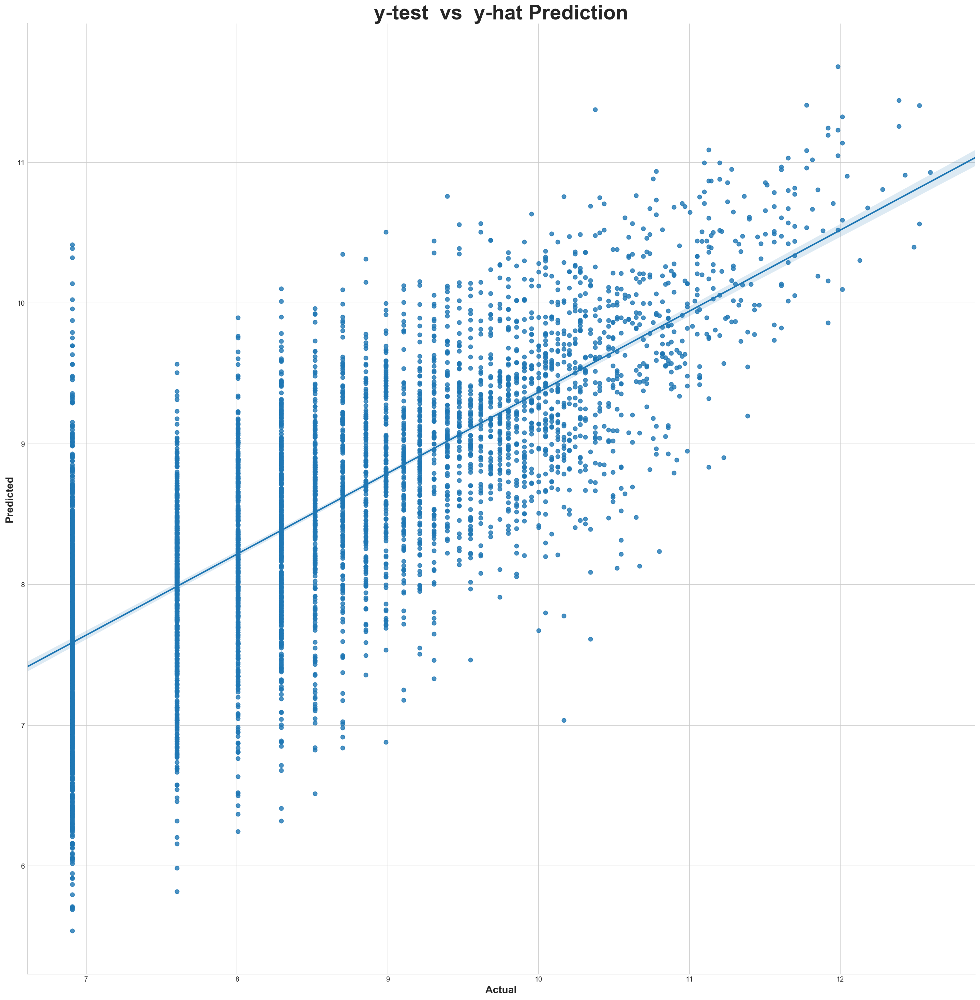

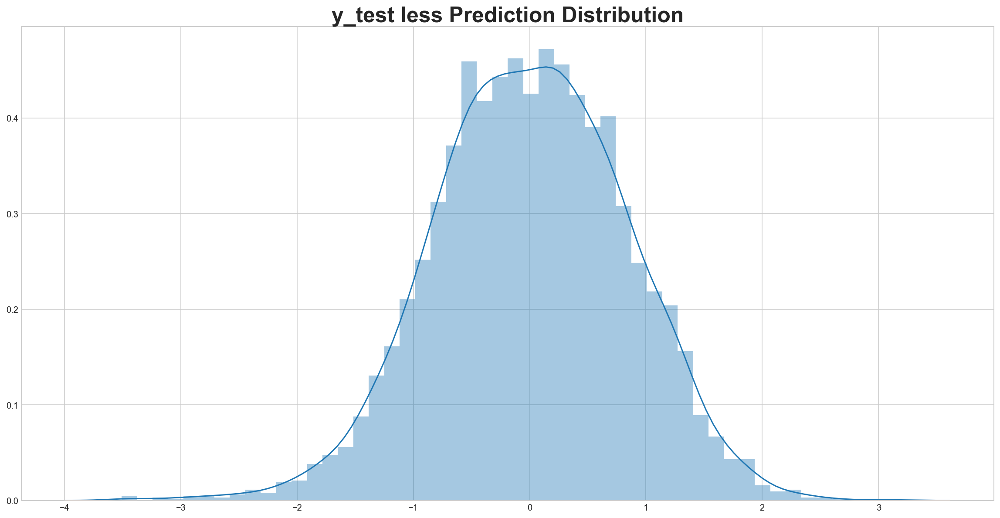

In [71]:
# Linear Regression fuction
linReg_fuc_Wage(X1,y1)

As it turn out, the Linear regression model can only achieved a score of 57 percent prediction accuracy on the Outfield player's wage value. Cross validation of K-fold have also been put in place to check and verify against the Linear regression model. The accuracy score obtained from cross validation produced almost simliar to the score of the Linear regression model.

In [72]:
# Linear Regression Cross Validation
reg_scores = cross_val_score(lm_W, Xs1, y_train1, cv=20)

print "Linear Regression Score :",reg_scores
print "Linear Mean Score :",np.mean(reg_scores)


Linear Regression Score : [ 0.57008808  0.53263962  0.57602174  0.59216519  0.58565714  0.5597751
  0.53643233  0.56409556  0.57028634  0.5777932   0.57206702  0.56492925
  0.5873343   0.5711102   0.59887549  0.54612786  0.56302415  0.56156169
  0.55081281  0.60457582]
Linear Mean Score : 0.569268645416


### Lasso Regression_Wage

The Lasso reduction techniques have been employed here to seek enchancement for the R2 score value.However, there was not much significant improvement toward the prediction result for model in this case. This lead me to believe that the Linear regression model is already behaving in it's optimal performance.

In [73]:
# Running LASSO Model 

print "LASSO Model"
las1=LassoCV(random_state=101)
las1.fit(Xs1,y_train1)
pred2=las1.predict(Xt1)
print "LASSO Score :",las1.score(Xt1,y_test1),"\n"

# LASSO Cross Validation
print "LASSO Cross Validation"
reg_scores1= cross_val_score(las1, Xs1, y_train1, cv=20)
print "LASSO Score(per k-fold) :", reg_scores1,"\n","LASSO Mean Score :" , np.mean(reg_scores1)


LASSO Model
LASSO Score : 0.574500488329 

LASSO Cross Validation
LASSO Score(per k-fold) : [ 0.57112231  0.53261409  0.57653223  0.59202163  0.58591821  0.55996525
  0.53659563  0.56506332  0.57002643  0.57743586  0.57154282  0.56509244
  0.58719875  0.57054302  0.59879444  0.54602561  0.56289559  0.56249693
  0.55102639  0.60454528] 
LASSO Mean Score : 0.569372811652


### Random Forest Regression_Wage

Implementing Random Forest regressor model

In [74]:
rf2 = RandomForestRegressor(random_state =101)
rf2.fit(Xs1, y_train1)
yhat2 = rf2.predict(Xt1)
print 'Random Forest test Score:', rf2.score(Xt1, y_test1)
print 'Random Forest training Score:', rf2.score(Xs1, y_train1)


Random Forest test Score: 0.644299247362
Random Forest training Score: 0.932270217574


Comparing the random forest test and training score above, we can see that 0.288 gap between them. We then implement the Grid search function to look for the optimal value for this model

In [75]:
# Grid_Search for Optimal value..

rf_params2 = {'max_depth':[1,3,5,9,15,21,30,35,40],"max_features": [5,10,15,20,25,29]}
rf_gridsearch = GridSearchCV(rf2, rf_params2, cv=5, verbose=1)
rf_gridsearch.fit(Xs1, y_train1)


Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  1.8min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=101, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_features': [5, 10, 15, 20, 25, 29], 'max_depth': [1, 3, 5, 9, 15, 21, 30, 35, 40]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=1)

Final outcomes after running Grid search have provided the below information.

In [76]:
print "Grid Search Best Parameter :", rf_gridsearch.best_params_,"\n"
print "Feature importance :",rf_gridsearch.estimator.feature_importances_, "\n"
print "Random Forest test Score (after Grid Search) :",rf_gridsearch.best_estimator_.score(Xt1,y_test1)
print "Random Forest train Score (after Grid Search) :",rf_gridsearch.best_estimator_.score(Xs1,y_train1),"\n"


Grid Search Best Parameter : {'max_features': 15, 'max_depth': 9} 

Feature importance : [ 0.01006912  0.01293906  0.01089735  0.01010603  0.16104987  0.01303234
  0.01378005  0.01108146  0.02109106  0.02037629  0.01045268  0.02688249
  0.01422892  0.01246947  0.01179636  0.0111698   0.02470001  0.01128587
  0.01884488  0.37233704  0.02183301  0.01510222  0.02930732  0.01281251
  0.01425715  0.07078129  0.01432058  0.0122133   0.0107825 ] 

Random Forest test Score (after Grid Search) : 0.670275916316
Random Forest train Score (after Grid Search) : 0.7783156905 



After running the Grid search fuction, the new gap score is 0.108 and as compared with the above 0.288 ( without grid search ). It did present some improvement. To see if overfitting occur for the random forest model, a learning curve is being plotted . 

Using a max depth of '9' (optimal) as recommended by Grid search

<module 'matplotlib.pyplot' from '/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.pyc'>

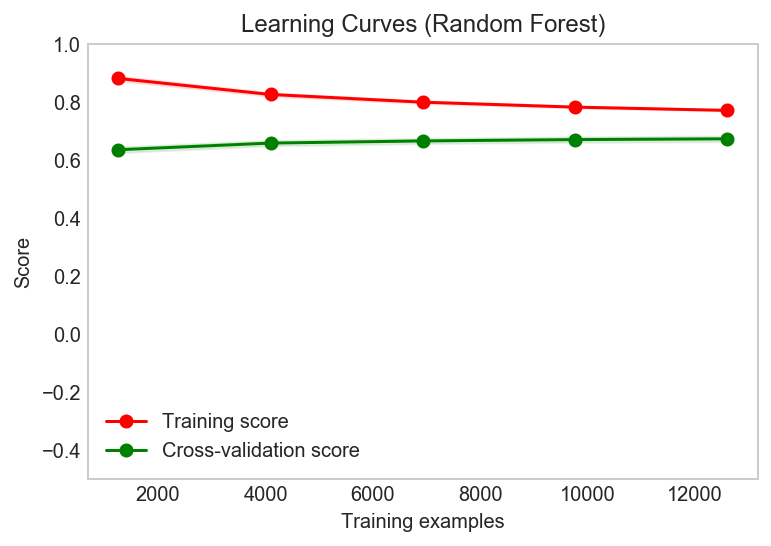

In [111]:
estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
           max_features=15, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=101, verbose=0, warm_start=False)

plot_learning_curve(estimator, title, X1, y1, ylim=(-.5, 1.),cv=cv, n_jobs=-1)


The testing and training learning curves converge at similar values. Using the tree depth from 9 (as recommended by Grid search) , this model can preform reasonably well at preventing overfitting and more adept in generalizing to new data

Setting up the features use for Random forest and print out the Top 10 coeff weighting predicted by model.

In [80]:
X = ofp_val[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
              'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
              'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing', 
              'Shot power','Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision',
              'Volleys']]

BestAttr = pd.DataFrame({'feature':X.columns,'importances':rf_gridsearch.estimator.feature_importances_}).sort_values("importances",ascending=False).transpose()
BestAttr

,19,4,25,22,11,16,20,8,9,18,...,27,14,17,15,7,2,28,10,3,0
feature,Reactions,Ball control,Standing tackle,Sliding tackle,Heading accuracy,Marking,Short passing,Dribbling,Finishing,Positioning,...,Vision,Long passing,Penalties,Long shots,Curve,Agility,Volleys,Free kick accuracy,Balance,Acceleration
importances,0.372337,0.16105,0.0707813,0.0293073,0.0268825,0.0247,0.021833,0.0210911,0.0203763,0.0188449,...,0.0122133,0.0117964,0.0112859,0.0111698,0.0110815,0.0108973,0.0107825,0.0104527,0.010106,0.0100691


Plotting the regression graph for Random Forest prediction.

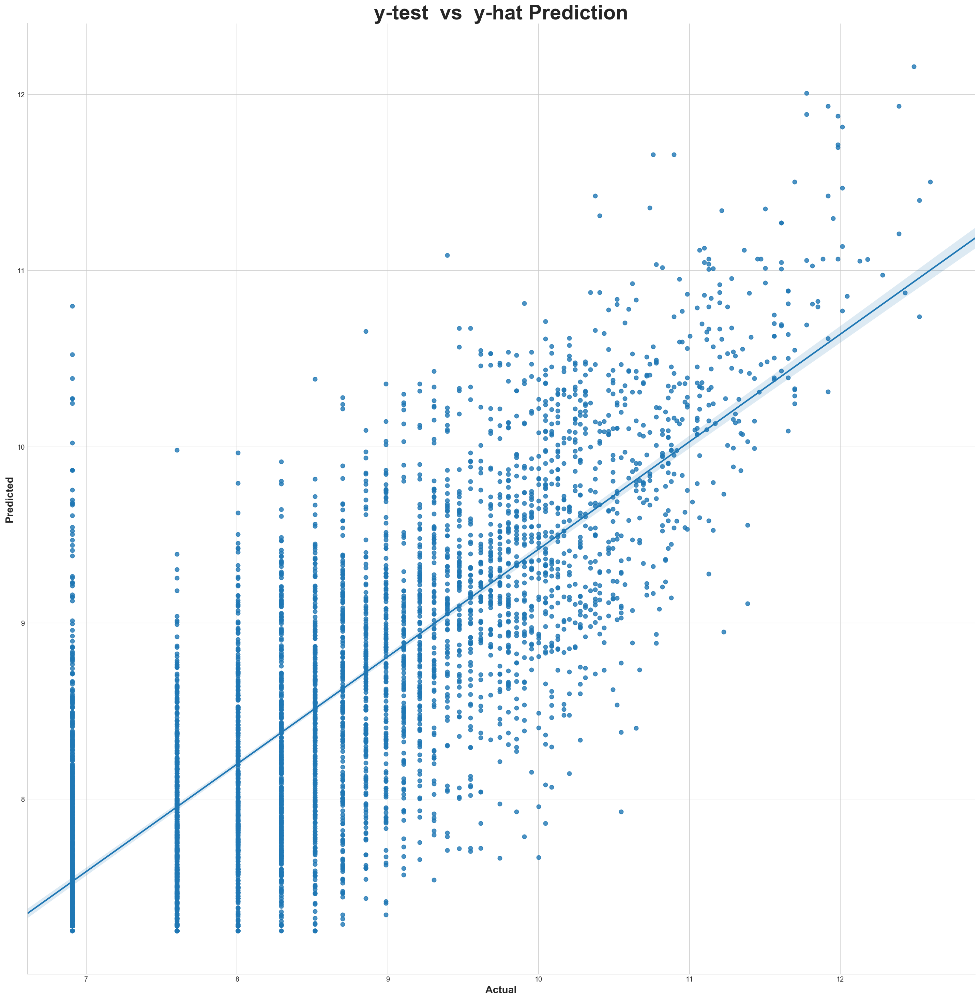

In [81]:
# Plotting of predicted graphs ( y_test vs Y_hat prediction)
Rfpred2 = pd.DataFrame(data = zip(y_test1,yhat2),columns=['actual', 'pred'])
print "\n"
sns.lmplot(x='actual',y='pred',data=Rfpred2,size=20)
plt.title("y-test  vs  y-hat Prediction", fontsize=30, fontweight='bold')
plt.xlabel('Actual', fontsize=15,fontweight='bold'),"/n"
plt.ylabel('Predicted', fontsize=15,fontweight='bold')

### Predicting Wage of 206 Outfield player_ Without Club ( Linear Regression )

From the dataset, it been notice that there are 206 players that has no afflilation with any club. Using the linear regression and random forest model, we tried to predict the wage for these players.



In [82]:
z = ofp_Nwg[['Acceleration', 'Aggression','Agility', 'Balance','Ball control', 'Composure', 'Crossing','Curve',
        'Dribbling', 'Finishing', 'Free kick accuracy','Heading accuracy', 'Interceptions', 'Jumping',
        'Long passing', 'Long shots', 'Marking', 'Penalties','Positioning', 'Reactions', 'Short passing','Shot power',
        'Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle','Strength', 'Vision', 'Volleys']]


Define Linear regression fuction for prediction of player's wage without club


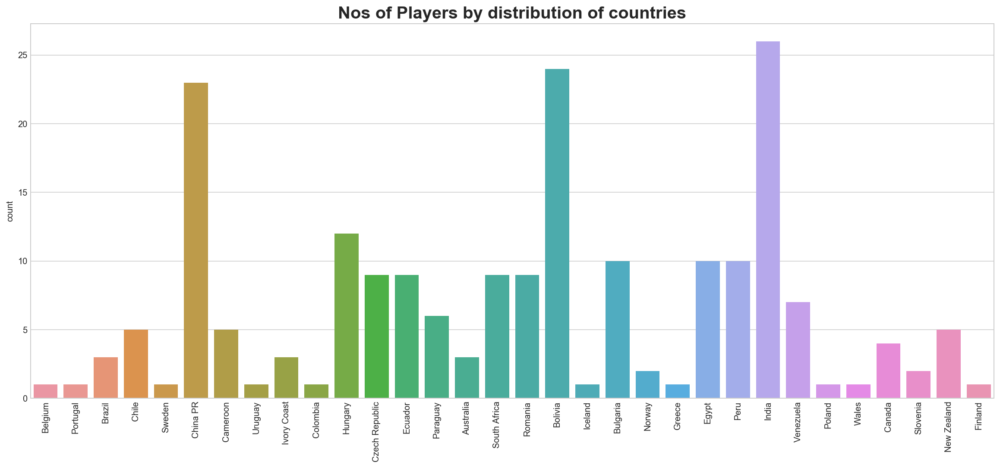

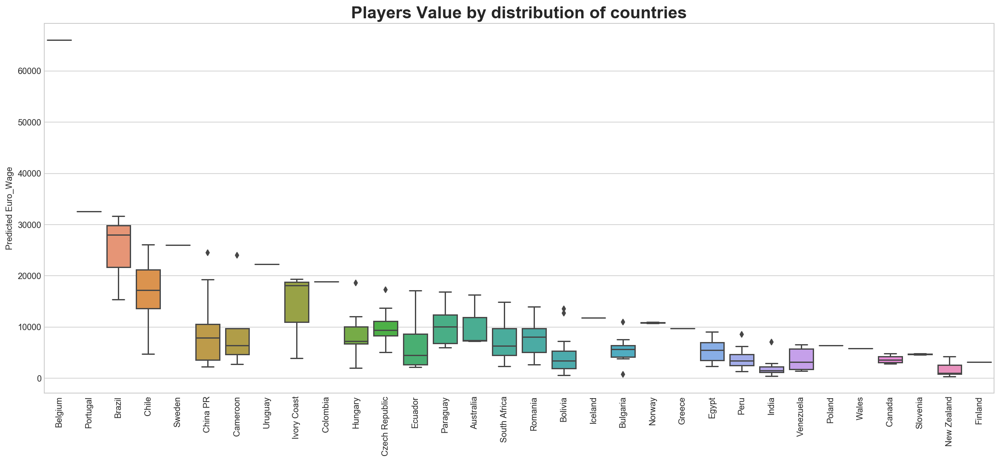

,2,1,4,0,24,3,21,6,17,16
Nationality,Belgium,Portugal,Brazil,Brazil,Chile,Sweden,China PR,Cameroon,Uruguay,Chile
Age,28,28,29,25,32,30,31,28,31,33
Overall,82,83,80,83,74,80,74,77,75,75
Potential,82,83,80,86,74,80,74,77,75,75
Player_Name,A. Witsel,Adrien Silva,Renato Augusto,Oscar,J. Fuenzalida,M. Berg,Gao Lin,B. Moukandjo,C. Rodríguez,J. Beausejour
Predicted Euro_Wage,66039.5,32565.2,31680.5,28011.6,26078.8,26014.8,24519.4,24067.2,22318.8,21192.9


In [83]:
def lin_pred_Wage(z,col):
    
    global predvalue1,com,lin_wage

# Prediction of value for Zero value players.
    
    scaler = StandardScaler().fit(z)
    Xnull=scaler.transform(z)

    prediction= lm_W.predict(Xnull)
    predvalue1 = np.exp(prediction)
    
### Prepare data for merging to prepare for Outcome table

    nclubpreddf = pd.DataFrame(data = zip(ofp_Nwg.Name,predvalue1),columns=["Player_Name", 'Predicted Euro_'+ col])    
    nclubpreddf_Value_Euro = nclubpreddf.copy()

    AgeCont=pd.concat([ofp_Nwg.Nationality,ofp_Nwg.Age],axis=1)
    AgeCont= AgeCont.join(ofp_Nwg["Overall"],how="right")
    AgeCont= AgeCont.join(ofp_Nwg["Potential"],how="right")

    AgeCont_reset = AgeCont.copy(deep=False)
    AgeCont_reset.reset_index(drop=True, inplace=True)
    
    com = AgeCont_reset.join(nclubpreddf,how='right').sort_values("Predicted Euro_"+col,ascending=False)

# Count Plot distribution
    
    fig, ax = plt.subplots(figsize=(20,8))
    sns.countplot(x ='Nationality',data= com)
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=10, rotation=90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Nos of Players by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    
# Value Plot distribution 

    plt.subplots(figsize = (20,8))
    sns.boxplot(x =com['Nationality'], y=com["Predicted Euro_"+col], data = com)#.set_xticklabels(70)
    plt.xticks(rotation = 90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Players Value by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    plt.show()

    
# Final Outcome Table

    lin_wage = com 
    return com.head(10).transpose() 

lin_pred_Wage(z,"Wage")


### Predicting Wage of 206 Outfield player_ Without Club ( Random Forest ) 

Define Random Forest regression fuction for prediction of player's wage without club

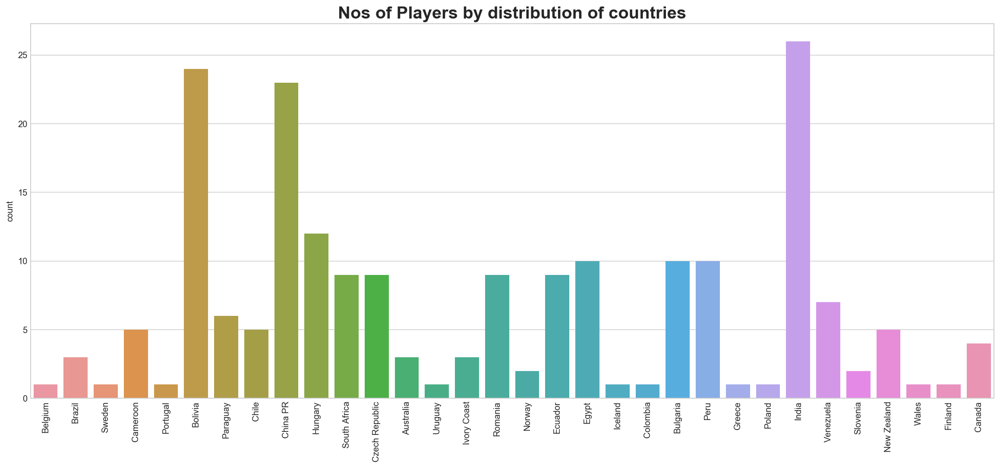

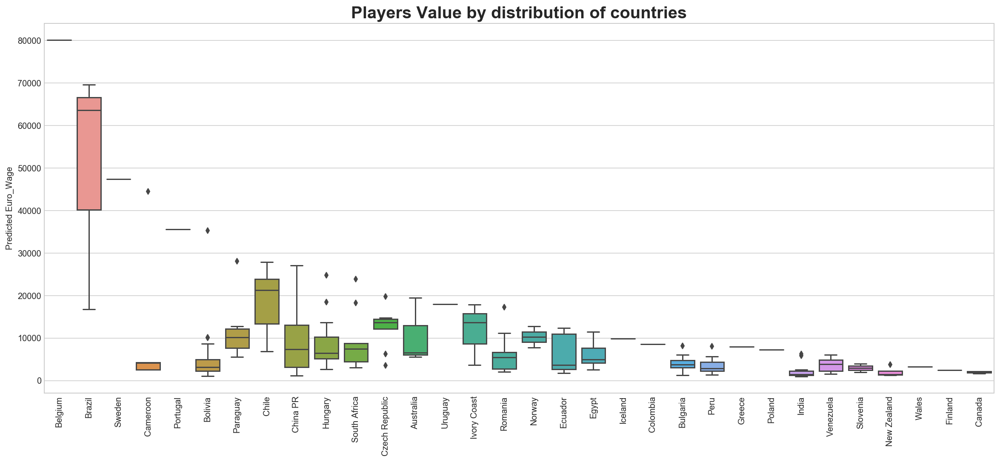

,2,4,0,3,6,1,15,9,24,10
Nationality,Belgium,Brazil,Brazil,Sweden,Cameroon,Portugal,Bolivia,Paraguay,Chile,China PR
Age,28,29,25,30,28,28,30,34,32,36
Overall,82,80,83,80,77,83,75,76,74,76
Potential,82,80,86,80,77,83,75,76,74,76
Player_Name,A. Witsel,Renato Augusto,Oscar,M. Berg,B. Moukandjo,Adrien Silva,M. Martins,C. Riveros,J. Fuenzalida,Zheng Zhi
Predicted Euro_Wage,80136.1,69673.5,63667.8,47433.8,44550.1,35583.8,35268.8,28125.6,27894.9,27079.9


In [86]:
def rf_pred_wage (z,col):
    
    global predvalue1,com,ranf_wage

# Prediction of value for Zero value players.
    
    scaler = StandardScaler().fit(z)
    Xnull=scaler.transform(z)

    prediction= rf2.predict(Xnull)
    predvalue1= np.exp(prediction)
    
### Prepare data for merging to prepare for Outcome table

    nclubpreddf = pd.DataFrame(data = zip(ofp_Nwg.Name,predvalue1),columns=["Player_Name", 'Predicted Euro_'+ col])    
    nclubpreddf_Value_Euro = nclubpreddf.copy()

    AgeCont=pd.concat([ofp_Nwg.Nationality,ofp_Nwg.Age],axis=1)
    AgeCont= AgeCont.join(ofp_Nwg["Overall"],how="right")
    AgeCont= AgeCont.join(ofp_Nwg["Potential"],how="right")

    AgeCont_reset = AgeCont.copy(deep=False)
    AgeCont_reset.reset_index(drop=True, inplace=True)
    
    com = AgeCont_reset.join(nclubpreddf,how='right').sort_values("Predicted Euro_"+col,ascending=False)

    # Count Plot distribution
    
    fig, ax = plt.subplots(figsize=(20,8))
    sns.countplot(x ='Nationality',data= com)
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=10, rotation=90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Nos of Players by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    
    # Value Plot distribution 

    plt.subplots(figsize = (20,8))
    sns.boxplot(x =com['Nationality'], y=com["Predicted Euro_"+col], data = com)#.set_xticklabels(70)
    plt.xticks(rotation = 90)
    plt.xlabel( ' ', fontsize=20, fontweight='bold', rotation = 0)
    plt.title('Players Value by distribution of countries', fontsize=20, fontweight='bold', rotation = 0)
    plt.show()

    
    # Final Outcome Table

    ranf_wage = com
    return com.head(10).transpose() 

rf_pred_wage(z,"Wage")

#### Summarize table _Top 6 players predicted by Model

In [120]:
#  Summarize table for Predicted Euro_Wage

# Linear regression table
lintable_wage = lin_wage.sort_index(ascending = True ).rename(columns={"Predicted Euro_Wage":"LR Predicted Euro_Wage"}) 

# Random forest Table
rftable_wage = ranf_wage.sort_index(ascending = True).rename(columns={"Predicted Euro_Wage":"RF Predicted Euro_Wage"}) 

# insert subset table and find the difference in Predicted Euro Wage 
rftable_wage["LR Predicted Euro_Wage"]= lintable_wage["LR Predicted Euro_Wage"]
rftable_wage["Diff Predicted Euro_Wage"] = rftable_wage["RF Predicted Euro_Wage"] - rftable_wage["LR Predicted Euro_Wage"]
x1 = rftable_wage.sort_values("RF Predicted Euro_Wage", ascending =False).head(6)

 

,2,4,0,3,6,1
Nationality,Belgium,Brazil,Brazil,Sweden,Cameroon,Portugal
Age,28,29,25,30,28,28
Overall,82,80,83,80,77,83
Potential,82,80,86,80,77,83
Player_Name,A. Witsel,Renato Augusto,Oscar,M. Berg,B. Moukandjo,Adrien Silva
RF Predicted Euro_Wage,80136.1,69673.5,63667.8,47433.8,44550.1,35583.8
LR Predicted Euro_Wage,66039.5,31680.5,28011.6,26014.8,24067.2,32565.2
Diff Predicted Euro_Wage,14096.6,37993,35656.3,21419,20482.9,3018.63


###### Findings

These two model may predict different wage for every players. Hence, we shall take the maximum of these wages to serve as upper limit and vice versa minimum value. The information obtain from this exercise can only serve as guide to negotiate for their remuneration package .

From the above table, we can see that linear regression and random forest have made same prediction for the same players about 7 out 10 times.

- Wages for this 6 players ranges from 80k to 32K (per month)
- Brazilian player, Renato Augusto & Oscar  and Portugal player Adrien Silva, command the highest gap (30K) for wage's range
- The rest of player are likely in range this gap range of 14K to 21k.

As the linear regression prediction yield an accuracy of 0.57. The model does not seem to be able to predict as well when using wage as target.For Random forest, it can only predict an accuracy of 0.67. 